##Principal component analysis PCA

In [1]:
import pandas as pd #Pandas handles tabular data
pd.set_option('display.float_format', lambda x: '%.3f' % x) # turn off scientific notation and too much decimal blah
import matplotlib.pyplot as plt # standard plotting library
import numpy as np #Numpy for linear algebra & co
import seaborn as sns # For pretty dataviz
sns.set_style("whitegrid") # Define style for dataviz

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Load the data

In [63]:
# load dataset into Pandas DataFrame
data = pd.read_csv('/content/drive/MyDrive/Session CSVs/ALL_buildings_PRETRAIN_02.csv')

### Brief exploration

In the following, we will do some of the standard inspections one should do with every new dataset to get a feeling for its påroperties.

In [64]:
# Check data types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24147 entries, 0 to 24146
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Amenities Count     24147 non-null  float64
 1   Unique Categories   24147 non-null  float64
 2   Land Diversity      24147 non-null  float64
 3   Price               24147 non-null  float64
 4   KPI Greenery        24147 non-null  float64
 5   KPI CO2 Absorption  24147 non-null  float64
 6   KPI Safety          24147 non-null  float64
 7   Sentiment           24147 non-null  float64
 8   Area Code           24147 non-null  int64  
 9   Transport KPI       24147 non-null  float64
 10  clue_small_area     24147 non-null  object 
dtypes: float64(9), int64(1), object(1)
memory usage: 2.0+ MB


In [65]:
data.columns

Index(['Amenities Count', 'Unique Categories', 'Land Diversity', 'Price',
       'KPI Greenery', 'KPI CO2 Absorption', 'KPI Safety', 'Sentiment',
       'Area Code', 'Transport KPI', 'clue_small_area'],
      dtype='object')

In [ ]:
data

## Data Filtering

In [ ]:
count = (new_df['Amenities_Total_Count'] < 8).sum()
print(count)


In [ ]:
dtype = data['geometry'].dtype
print(dtype)


In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import entropy

# Assuming the dataframe is named 'data'

# Create a new dataframe called new_df based on data
new_df = data.copy()

# Define amenities columns
amenities_columns = ['tree', 'bench', 'fountain', 'drinking_water', 'memorial', 'sculpture', 'bicycle_parking', 'bicycle_rental', 'recycling', 'waste_basket', 'restaurant', 'bar', 'toilets', 'playground', 'picnic_site', 'museum', 'monument', 'footway']

# Columns to be dropped
drop_columns = ['latitude','longitude','wood_green_area', 'tree_ratio', 'bench_ratio', 'fountain_ratio', 'drinking_water_ratio', 'memorial_ratio', 'sculpture_ratio', 'bicycle_parking_ratio', 'bicycle_rental_ratio', 'recycling_ratio', 'waste_basket_ratio', 'restaurant_ratio', 'bar_ratio', 'museum_ratio', 'monument_ratio', 'playground_ratio', 'picnic_site_ratio', 'toilets_ratio', 'footway_ratio', 'rating', 'place_id', 'reviews', 'reviews_text']

# Step 1
new_df['amenities_score'] = new_df[amenities_columns].sum(axis=1)

# Rename 'amenities_score' to 'Amenities_Total_Count'
new_df = new_df.rename(columns={'amenities_score': 'Amenities_Total_Count'})

# Step 2
new_df['green_cover_perc'] = new_df['green_cover_perc'].clip(upper=100)
new_df = new_df.rename(columns={'green_cover_perc': 'Vegetation_Cover'})

# Step 3
new_df = new_df.drop(columns=drop_columns)

# Step 4
# Shannon Diversity Index
new_df['Amenities_Diversity_Shannon'] = new_df[amenities_columns].apply(lambda x: entropy(x), axis=1)

# Proportion of non-zero amenities
new_df['Amenities_Diversity'] = new_df[amenities_columns].apply(lambda x: np.count_nonzero(x) / len(amenities_columns), axis=1)

# Convert 'avg_review_time' to seconds past midnight
new_df['avg_review_time'] = pd.to_datetime(new_df['avg_review_time']).dt.hour * 3600 + pd.to_datetime(new_df['avg_review_time']).dt.minute * 60 + pd.to_datetime(new_df['avg_review_time']).dt.second

# Step 5
# Function to calculate IQR and remove outliers for Amenities_Total_Count
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    df = df[~((df[column] < (Q1 - 1.5 * IQR)) | (df[column] > (Q3 + 1.5 * IQR)))]
    return df

# Remove outliers from the Amenities_Total_Count
new_df = remove_outliers(new_df, 'Amenities_Total_Count')

from shapely.geometry import Polygon
from shapely import wkt

def calculate_deviation(wkt_str):
    # Load the WKT string into a shapely geometry
    geom = wkt.loads(wkt_str)

    # Calculate the area of the actual shape
    area_actual = geom.area

    # Calculate the area of the bounding box
    bounding_box = geom.envelope
    area_bounding_box = bounding_box.area

    # If the bounding box area is zero, return a deviation of zero
    if area_bounding_box == 0:
        return 0

    # Calculate the deviation
    deviation = 1 - (area_actual / area_bounding_box)

    return deviation

new_df['Shape_Deviation'] = new_df['park_polygon_geometry'].apply(calculate_deviation)


# Creating new features by merging existing columns
new_df['Urban_Circulation_Amenities'] = new_df['bicycle_parking'] + new_df['bicycle_rental'] + new_df['footway']
new_df['Cultural_Context'] = new_df['memorial'] + new_df['sculpture'] + new_df['museum'] + new_df['monument'] + new_df['fountain'] + new_df['restaurant'] + new_df['bar']
new_df['Urban_Features'] = new_df['tree'] + new_df['bench'] + new_df['recycling'] + new_df['toilets'] + new_df['playground'] + new_df['picnic_site'] + new_df['waste_basket'] + new_df['drinking_water']

# Drop original columns after creating new features
new_df = new_df.drop(['tree', 'bench', 'fountain', 'drinking_water', 'memorial', 'sculpture', 'bicycle_parking', 'bicycle_rental', 'recycling', 'waste_basket', 'restaurant', 'bar', 'toilets', 'playground', 'picnic_site', 'museum', 'monument', 'footway','geometry','park_polygon_geometry'], axis=1)

new_df['reviews_count'] = new_df['reviews_count'].astype(int)
new_df = new_df[new_df['Amenities_Total_Count'] >= 5]


/usr/local/lib/python3.10/dist-packages/scipy/stats/_entropy.py:135: RuntimeWarning: invalid value encountered in divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)


In [ ]:
new_df

,city,area,Vegetation_Cover,Amenities_Total_Count,park_name,reviews_count,weighted_rating,sentiment_score,Sentiment,avg_review_time,time_of_day,Amenities_Diversity_Shannon,Amenities_Diversity,Shape_Deviation,Urban_Circulation_Amenities,Cultural_Context,Urban_Features
2,Firenze,0.024,62.709,25,Giardino Rocca Strozzi,1304,4.258,0.996,Positive,54593,afternoon,0.849,0.278,0.533,3,2,20
4,Firenze,0.001,4.118,45,Piazza Giovambattista Giorgini,15,4.044,0.991,Positive,51612,afternoon,0.961,0.278,0.523,15,2,28
5,Firenze,0.005,17.130,104,Piazza della Vittoria,508,4.058,0.979,Positive,68952,evening,1.354,0.389,0.381,32,1,71
6,Firenze,0.175,11.423,19,Parco di Villa Montalvo,1661,4.180,0.710,Positive,51792,afternoon,0.409,0.167,0.616,17,1,1
7,Firenze,0.027,17.131,25,Lippi's Garden,40,4.066,0.997,Positive,38868,morning,0.168,0.111,0.529,25,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7337,Roma,0.003,100.000,7,Parco Antonella Renzi,1,3.823,0.000,Negative,58938,afternoon,0.000,0.056,0.221,0,0,7
7342,Roma,0.094,6.959,14,Parco Prampolini,138,3.849,0.988,Positive,46045,noon,1.171,0.222,0.323,7,0,7
7344,Roma,0.037,0.000,11,Parco della Rimessola,1,3.824,0.000,Negative,59348,afternoon,1.034,0.222,0.694,3,0,8
7348,Roma,0.005,5.276,52,Parco Caduti del Corpo nazionale dei Vigili de...,2,3.823,0.612,Positive,55611,afternoon,0.408,0.222,0.271,3,0,49


In [ ]:
new_df.columns

In [ ]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    df = df[~((df[column] < (Q1 - 1.5 * IQR)) | (df[column] > (Q3 + 1.5 * IQR)))]
    return df

new_df = remove_outliers(new_df, 'reviews_count')
new_df = new_df[new_df['reviews_count'] >= 5]


In [ ]:
# Descriptive statistics
new_df.describe()

,area,Vegetation_Cover,Amenities_Total_Count,reviews_count,weighted_rating,sentiment_score,avg_review_time,Amenities_Diversity_Shannon,Amenities_Diversity,Shape_Deviation,Urban_Circulation_Amenities,Cultural_Context,Urban_Features
count,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000
mean,0.033,28.622,37.552,214.316,4.077,0.863,50678.307,0.859,0.245,0.457,17.057,1.001,19.494
std,0.091,34.737,34.397,260.710,0.168,0.354,10128.215,0.468,0.130,0.185,18.339,2.016,25.677
min,0.000,0.000,5.000,5.000,3.594,-0.995,7145.000,0.000,0.056,0.000,0.000,0.000,0.000
25%,0.004,1.595,11.000,29.000,3.962,0.932,44451.000,0.500,0.167,0.366,5.000,0.000,2.000
50%,0.010,11.851,24.000,103.000,4.065,0.978,51068.000,0.876,0.222,0.472,11.000,0.000,8.000
75%,0.029,45.608,53.000,304.000,4.211,0.991,57782.000,1.213,0.333,0.562,22.000,1.000,26.500
max,2.347,100.000,146.000,1164.000,4.647,1.000,79960.000,2.114,0.833,0.982,136.000,32.000,134.000


In [ ]:
new_df

,city,area,Vegetation_Cover,Amenities_Total_Count,park_name,reviews_count,weighted_rating,sentiment_score,Sentiment,avg_review_time,time_of_day,Amenities_Diversity_Shannon,Amenities_Diversity,Shape_Deviation,Urban_Circulation_Amenities,Cultural_Context,Urban_Features
4,Firenze,0.001,4.118,45,Piazza Giovambattista Giorgini,15,4.044,0.991,Positive,51612,afternoon,0.961,0.278,0.523,15,2,28
5,Firenze,0.005,17.130,104,Piazza della Vittoria,508,4.058,0.979,Positive,68952,evening,1.354,0.389,0.381,32,1,71
7,Firenze,0.027,17.131,25,Lippi's Garden,40,4.066,0.997,Positive,38868,morning,0.168,0.111,0.529,25,0,0
9,Firenze,0.007,2.442,106,Piazza Torquato Tasso,152,4.049,0.813,Positive,46706,noon,1.076,0.500,0.568,30,6,70
12,Firenze,0.144,0.000,10,Parco Chico Mendez,574,4.144,0.965,Positive,50035,noon,0.639,0.167,0.499,8,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7316,Roma,0.009,2.619,20,Passeggiata del Gianicolo,830,4.019,0.977,Positive,54542,afternoon,0.984,0.278,0.399,14,1,5
7321,Roma,0.113,2.943,25,Parco del Risaro,211,3.853,0.881,Positive,53559,afternoon,0.334,0.167,0.500,23,0,2
7332,Roma,0.009,7.706,13,Parco Urbano di Via Domenico Purificato,76,3.811,-0.982,Negative,42241,morning,0.000,0.056,0.759,13,0,0
7342,Roma,0.094,6.959,14,Parco Prampolini,138,3.849,0.988,Positive,46045,noon,1.171,0.222,0.323,7,0,7


In [ ]:
new_df.to_csv('/content/drive/MyDrive/Data - Encoding - Group/ALL_PARKS_TRAINING_5.csv', index=False)


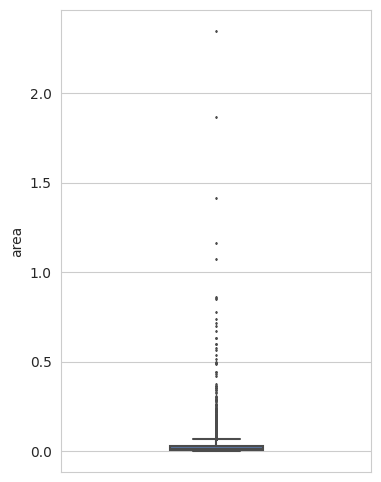

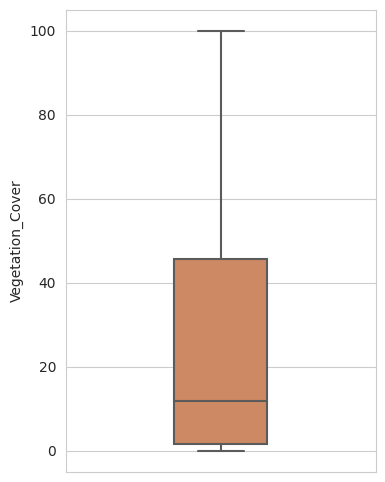

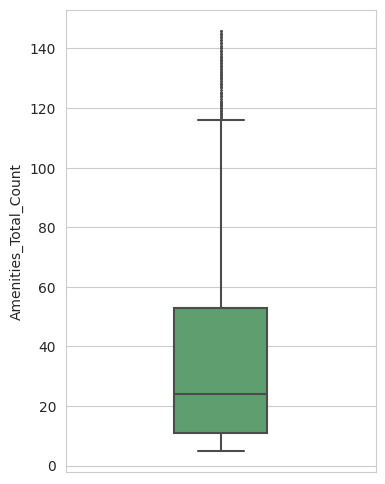

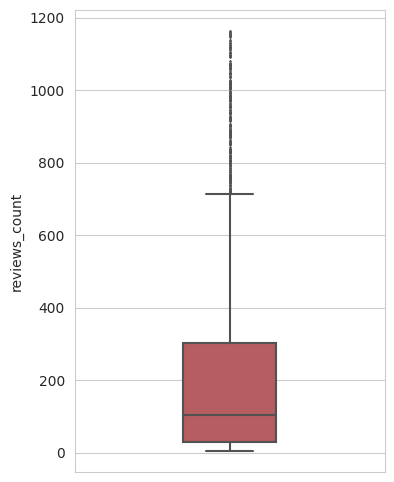

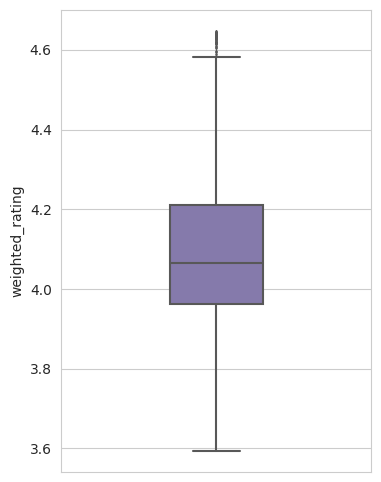

...

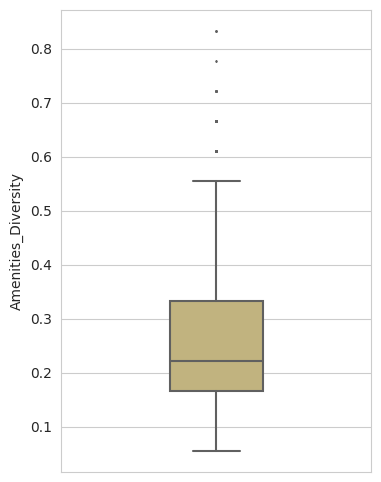

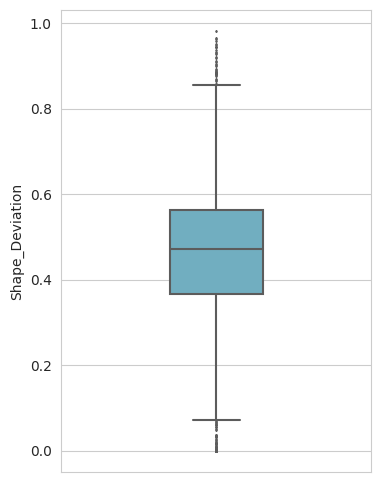

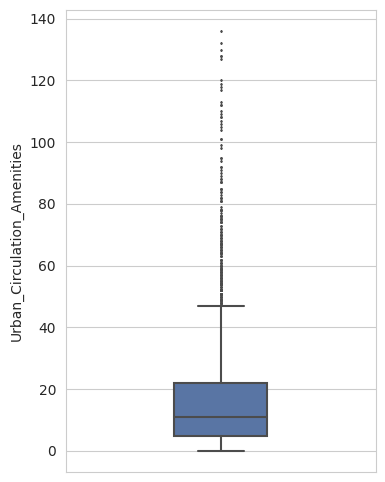

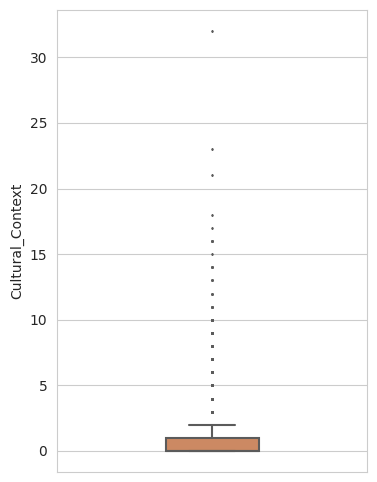

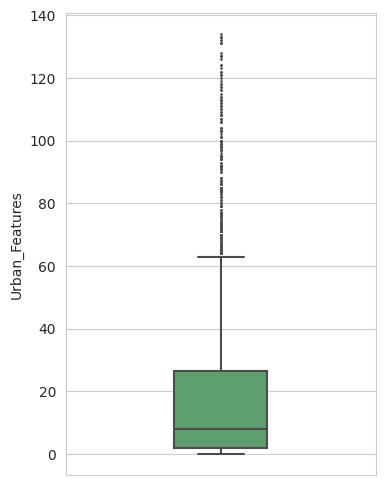

In [ ]:
# Assuming 'new_df' is your DataFrame

# Select only numerical columns
numerical_cols = new_df.select_dtypes(include=[np.number])

# Set the style and color palette
sns.set_style("whitegrid")
palette = sns.color_palette("deep", len(numerical_cols.columns))

# Marker size for the outliers
fliersize = 1

# Create the box plots
for column, color in zip(numerical_cols, palette):
    fig, ax = plt.subplots(figsize=(4, 6))  # Adjust the figure size as needed

    # Plot the boxplot with seaborn
    box_plot = sns.boxplot(y=new_df[column], ax=ax, color=color, width=0.3)

    # Get the underlying matplotlib boxplot object
    for flier in box_plot.get_lines()[len(box_plot.get_lines())//2:]:
        # Adjust the size of the flier markers (outliers)
        flier.set_markersize(fliersize)

    plt.show()


## Correlation

<ipython-input-6-6fa12bb6bf56>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = data.corr()


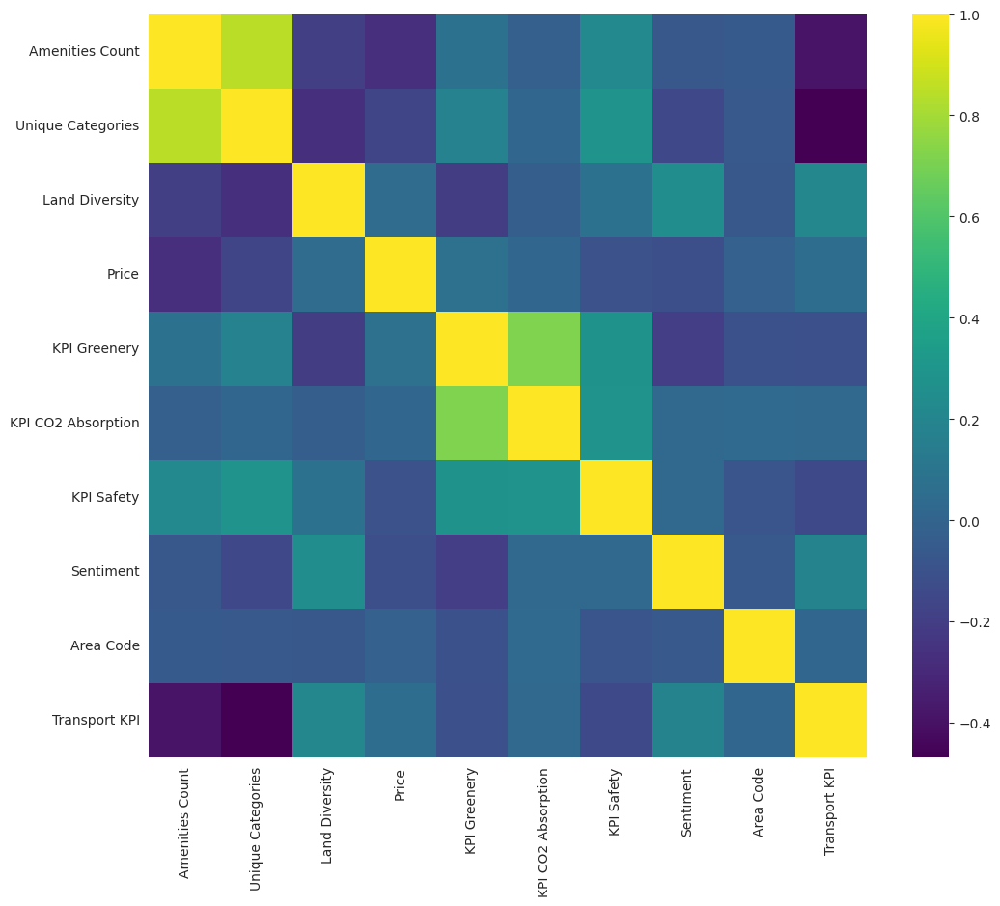

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix
corr_matrix = data.corr()

# Define the size of the figure
plt.figure(figsize=(12, 10))

# Create a heatmap with the specified colormap
sns.heatmap(corr_matrix, cmap='viridis', annot=False, fmt=".2f")

# Display the plot
plt.show()


In [ ]:
data.columns

### SNSPLOTS

In [ ]:
data.drop("Unnamed: 0", axis=1, inplace=True)


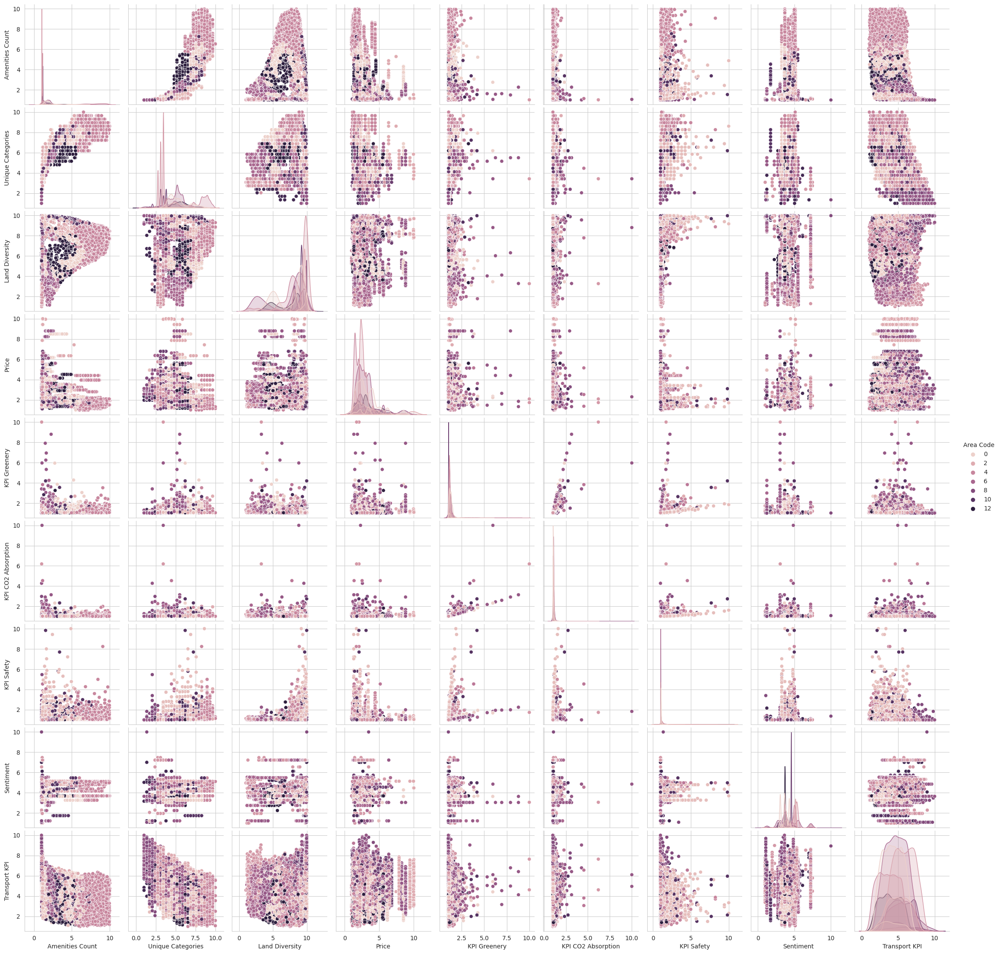

In [7]:
# Here, one of my very favorite visualizations... save that one.
# Sns pairplot provides a matrix with scatters on the triangles, and the distribution on the diagonal
sns.pairplot(data, hue='Area Code')

In [ ]:
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

# Remap Amenities_Diversity between 0 and 1
scaler = MinMaxScaler()
new_df['weighted_rating_norm'] = scaler.fit_transform(new_df[['weighted_rating']])

# Select numeric columns excluding 'Amenities_Diversity'
numeric_cols = new_df.select_dtypes(include=[np.number]).columns.tolist()
numeric_cols.remove('weighted_rating')

# Plot pairplot with hue being the normalized Amenities_Diversity
sns.pairplot(new_df, vars=numeric_cols, palette="plasma", hue="weighted_rating_norm")

plt.show()


In [ ]:
sns.swarmplot(data, x="species", y="petal length", hue="species")

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(data=new_df, x="city")
plt.xticks(rotation=90)  # Rotate x-axis labels to be vertical
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of column names
columns = ["avg_review_time", "Amenities_Diversity_Shannon", "Amenities_Diversity",
           "Shape_Deviation", "Urban_Circulation_Amenities", "Cultural_Context",
           "Urban_Features", "reviews_count", "weighted_rating", "sentiment_score"]

# Create a histogram for each column
for col in columns:
    plt.figure(figsize=(10, 6))  # Optional: Set the figure size
    sns.histplot(data=new_df, x=col, color="mediumaquamarine")
    plt.title(f'Histogram of {col}')  # Optional: Set the title of the plot
    plt.show()


In [ ]:
import pandas as pd

# assuming data is your DataFrame
for col in data.columns:
    try:
        data[col] = pd.to_numeric(data[col])
    except ValueError:
        pass


In [ ]:
# And lastly, a correlation plot
sns.heatmap(new_df.corr())

### Preprocessing

In [ ]:
# Replace the link with your own link
file_url = "/content/drive/MyDrive/Data - Encoding - Group/ALL_PARKS_TRAINING_10.csv"

new_df = pd.read_csv(file_url)

In [ ]:
new_df

,city,area,Vegetation_Cover,Amenities_Total_Count,park_name,reviews_count,weighted_rating,sentiment_score,avg_review_time,Amenities_Diversity_Shannon,Amenities_Diversity,Shape_Deviation,Urban_Circulation_Amenities,Cultural_Context,Urban_Features
0,Firenze,0.001,4.118,45,Piazza Giovambattista Giorgini,15,4.044,0.991,51612,0.961,0.278,0.523,15,2,28
1,Firenze,0.005,17.130,104,Piazza della Vittoria,508,4.058,0.979,68952,1.354,0.389,0.381,32,1,71
2,Firenze,0.027,17.131,25,Lippi's Garden,40,4.066,0.997,38868,0.168,0.111,0.529,25,0,0
3,Firenze,0.007,2.442,106,Piazza Torquato Tasso,152,4.049,0.813,46706,1.076,0.500,0.568,30,6,70
4,Firenze,0.144,0.000,10,Parco Chico Mendez,574,4.144,0.965,50035,0.639,0.167,0.499,8,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2769,Roma,0.009,2.619,20,Passeggiata del Gianicolo,830,4.019,0.977,54542,0.984,0.278,0.399,14,1,5
2770,Roma,0.113,2.943,25,Parco del Risaro,211,3.853,0.881,53559,0.334,0.167,0.500,23,0,2
2771,Roma,0.009,7.706,13,Parco Urbano di Via Domenico Purificato,76,3.811,-0.982,42241,0.000,0.056,0.759,13,0,0
2772,Roma,0.094,6.959,14,Parco Prampolini,138,3.849,0.988,46045,1.171,0.222,0.323,7,0,7


In [ ]:
new_df.columns

Index(['city', 'area', 'Vegetation_Cover', 'Amenities_Total_Count',
       'park_name', 'reviews_count', 'weighted_rating', 'sentiment_score',
       'avg_review_time', 'Amenities_Diversity_Shannon', 'Amenities_Diversity',
       'Shape_Deviation', 'Urban_Circulation_Amenities', 'Cultural_Context',
       'Urban_Features'],
      dtype='object')

In [66]:
data

,Amenities Count,Unique Categories,Land Diversity,Price,KPI Greenery,KPI CO2 Absorption,KPI Safety,Sentiment,Area Code,Transport KPI,clue_small_area
0,4.033,6.538,7.392,1.902,1.214,1.072,1.048,3.691,12,4.527,West Melbourne (Residential)
1,4.033,6.538,7.392,2.207,1.214,1.072,1.048,3.691,12,3.478,West Melbourne (Residential)
2,4.033,7.577,4.695,2.348,1.636,1.152,1.123,3.637,0,3.391,Carlton
3,4.033,7.577,4.695,2.348,1.636,1.152,1.123,3.691,0,5.758,Carlton
4,4.033,7.577,4.502,2.348,1.636,1.152,1.123,3.637,0,4.291,Carlton
...,...,...,...,...,...,...,...,...,...,...,...
24142,1.127,3.423,9.970,3.406,1.084,1.036,1.837,3.273,1,4.810,Docklands
24143,1.639,6.538,8.311,3.260,1.056,1.032,1.081,5.140,2,3.320,East Melbourne
24144,1.127,2.731,9.784,3.779,1.049,1.038,1.004,7.225,3,6.152,Kensington
24145,1.127,2.731,9.751,3.260,1.049,1.037,1.004,7.225,3,6.295,Kensington


In [67]:
columns_to_drop = ['Area Code','clue_small_area','Price']

data_num =data.drop(columns=columns_to_drop)


Since in PCA exercises the features used can be of different scale (eg. meter & kilometer) or dispolay a very different variance, it is common practice in ML workflow to normalize features. By doing so, we prevent features with high variance or scale ranges to dominate.

We here apply a standard scaler, where we substract for every feature its mean, and thyen divide by its standard deviation.

$$StandardScale() = {\frac {X-\mu }{\sigma }}$$

In [68]:
from sklearn.preprocessing import StandardScaler

In [69]:
print(data_num.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24147 entries, 0 to 24146
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Amenities Count     24147 non-null  float64
 1   Unique Categories   24147 non-null  float64
 2   Land Diversity      24147 non-null  float64
 3   KPI Greenery        24147 non-null  float64
 4   KPI CO2 Absorption  24147 non-null  float64
 5   KPI Safety          24147 non-null  float64
 6   Sentiment           24147 non-null  float64
 7   Transport KPI       24147 non-null  float64
dtypes: float64(8)
memory usage: 1.5 MB
None


In [70]:
# Let's standard-scale our data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_num)

In [71]:
# What are mean and Sd now?
pd.DataFrame(data_num, columns=data_num.columns).describe()

,Amenities Count,Unique Categories,Land Diversity,KPI Greenery,KPI CO2 Absorption,KPI Safety,Sentiment,Transport KPI
count,24147.000,24147.000,24147.000,24147.000,24147.000,24147.000,24147.000,24147.000
mean,2.544,5.075,7.996,1.199,1.091,1.135,4.216,4.767
std,2.297,1.824,2.173,0.253,0.139,0.378,1.044,1.601
min,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
25%,1.135,3.423,7.482,1.079,1.042,1.018,3.690,3.568
50%,1.612,4.808,8.816,1.137,1.071,1.044,4.160,4.759
75%,2.424,5.846,9.624,1.252,1.105,1.088,4.983,5.927
max,10.000,10.000,10.000,10.000,10.000,10.000,10.000,10.000


In [48]:
data_num.columns

Index(['Amenities Count', 'Unique Categories', 'Land Diversity',
       'KPI Greenery', 'KPI CO2 Absorption', 'KPI Safety', 'Sentiment',
       'Transport KPI', 'Cluster'],
      dtype='object')

### Executing PCA

In [72]:
# Instantiate a PCA object
from sklearn.decomposition import PCA # PCA from  sklearn, the python ML standard library
model = PCA() # Number of components needs to be defined. We just for illustration take about half of the numbers of features

In [73]:
# Fit the model
model.fit(data_num)

PCA()

In [74]:
# Fit and transform the data
data_reduced = model.transform(data_num)
data_num_reduced_df = pd.DataFrame(data_reduced)
#data_num_reduced_df["Sentiment"] = data["Sentiment"]

print(data_num_reduced_df)

           0      1      2      3      4      5      6      7
0      2.154 -0.105  0.320 -0.497  0.189 -0.173  0.020  0.003
1      2.474 -0.091 -0.650 -0.287  0.071 -0.178  0.026  0.005
2      3.994  2.226 -0.267 -0.126  0.838 -0.016  0.302 -0.083
3      3.269  2.187  1.930 -0.548  1.115 -0.005  0.290 -0.089
4      3.785  2.391  0.595 -0.281  0.935 -0.007  0.292 -0.084
...      ...    ...    ...    ...    ...    ...    ...    ...
24142 -2.493 -0.975 -0.948 -1.018 -0.558  0.693 -0.375 -0.022
24143  0.449 -0.341 -1.429  0.896  1.657 -0.339 -0.105  0.012
24144 -3.516 -1.200  0.936  2.625 -0.375 -0.017  0.040 -0.068
24145 -3.549 -1.172  1.074  2.601 -0.360 -0.016  0.038 -0.069
24146  5.161 -2.381  0.200  0.707  1.426  0.551  0.314  0.034

[24147 rows x 8 columns]


### Inspecting Results

<Axes: >

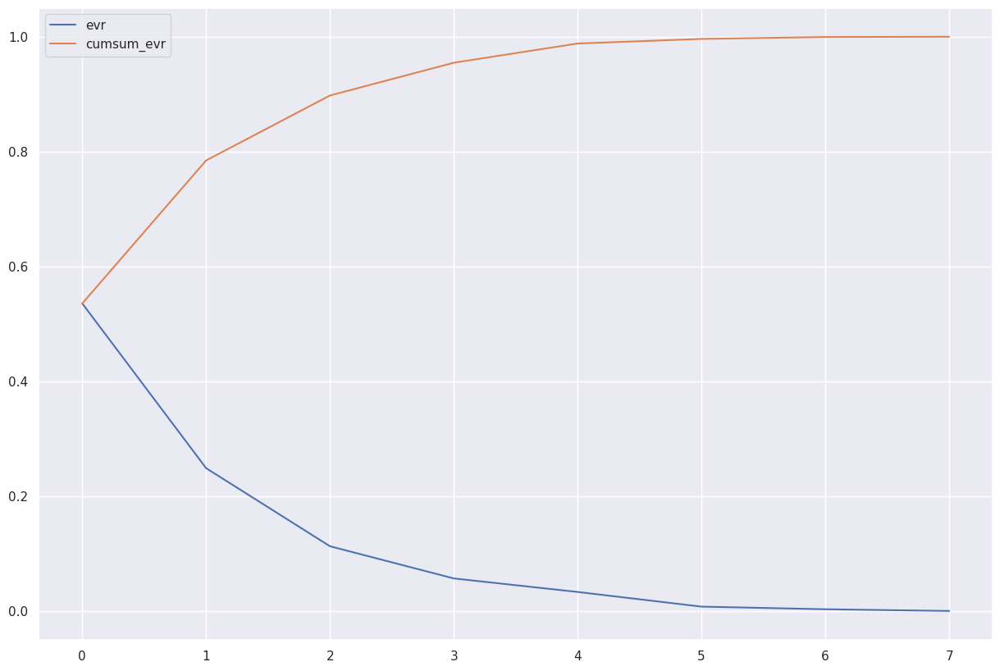

In [75]:
plot_data = pd.DataFrame({'evr': model.explained_variance_ratio_, 'cumsum_evr': np.cumsum(model.explained_variance_ratio_)}).stack()
sns.set(rc={'figure.figsize':(15,10)})
sns.lineplot(y = plot_data.values, x = plot_data.index.get_level_values(0), hue=plot_data.index.get_level_values(1))

In [76]:
print(model.explained_variance_ratio_)

[5.35701628e-01 2.48984066e-01 1.13059950e-01 5.70283403e-02
 3.34846259e-02 7.94021752e-03 3.39100015e-03 4.10171496e-04]


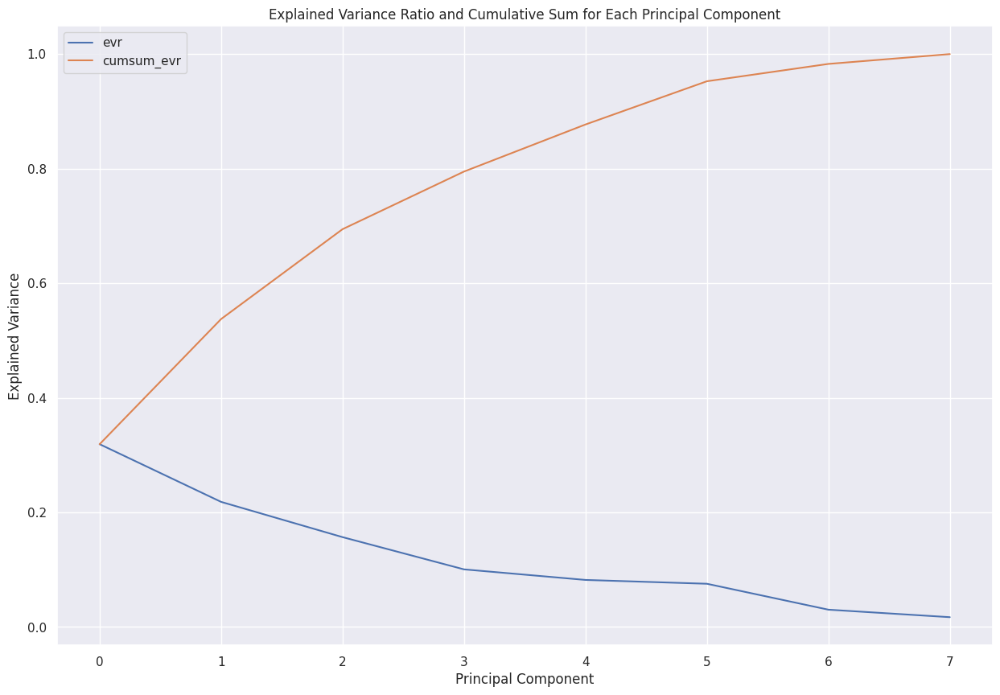

In [82]:
# Import the necessary libraries
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

# First, we need to standardize the features in data_num
scaler = StandardScaler()
data_num_scaled = scaler.fit_transform(data_num)

# Create a PCA instance
pca = PCA()

# Fit the PCA instance on the scaled data
pca.fit(data_num_scaled)

# Transform the data
data_num_reduced = pca.transform(data_num_scaled)

# Calculate the explained variance ratio and cumulative sum of explained variance ratio
evr = pca.explained_variance_ratio_
cumsum_evr = np.cumsum(evr)

# Plot the explained variance ratio and its cumulative sum
plot_data = pd.DataFrame({'evr': evr, 'cumsum_evr': cumsum_evr}).stack()
sns.set(rc={'figure.figsize':(15,10)})
sns.lineplot(y = plot_data.values, x = plot_data.index.get_level_values(0), hue=plot_data.index.get_level_values(1))
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.title('Explained Variance Ratio and Cumulative Sum for Each Principal Component')
plt.show()


PLOTTING ALL THE PCS

In [ ]:
def myplot_df(df,coeff, scale, labels = None):
    df["xs"] = df[df.columns[0]]
    df["ys"] = df[df.columns[1]]
    #print(df)

    n = coeff.shape[0]


    if scale == True:
        scalex = 1.0/(df["xs"].max() - df["xs"].min())
        scaley = 1.0/(df["ys"].max() - df["ys"].min())

        df["xs"] = scalex *  df["xs"]
        df["ys"] = scaley * df["ys"]

    g = sns.scatterplot(x='xs',y='ys', data=df)
    g.legend(title = "PCA", loc='center left', bbox_to_anchor=(1, 0.5), ncol=1, frameon = False)

    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, data_num.columns[i], color = 'g', ha = 'center', va = 'center', alpha = 0.5)
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')

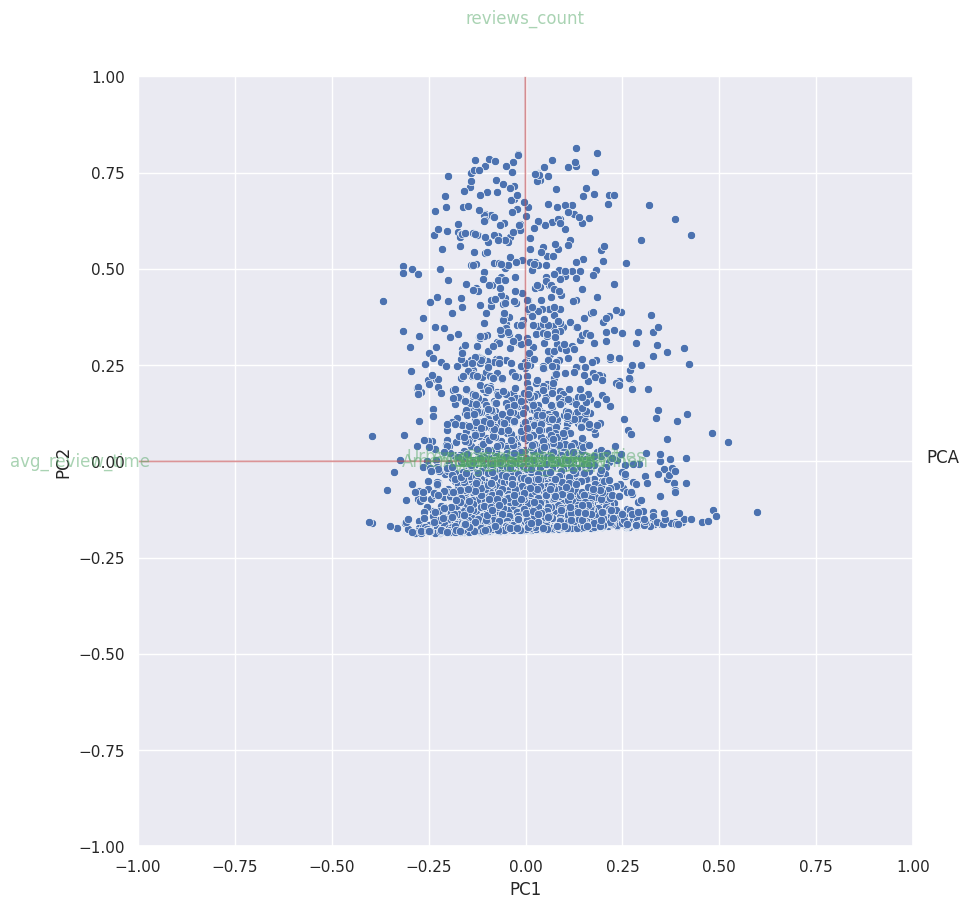

In [ ]:
plt.xlim(-1,1)
plt.ylim(-1,1)
plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
fig = plt.gcf()
fig.set_size_inches(10, 10)
myplot_df(data_num_reduced_df, np.transpose(model.components_[0:2, :]), True)

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 131 (\x83) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


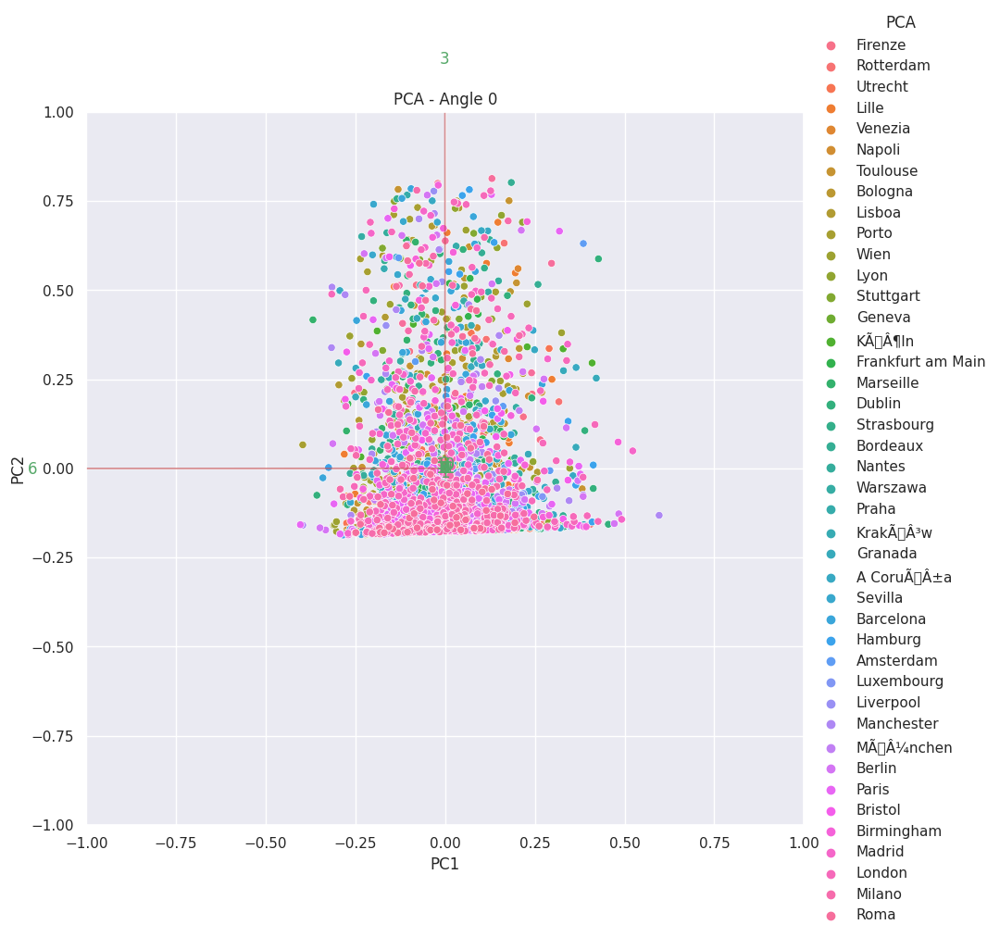

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 131 (\x83) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


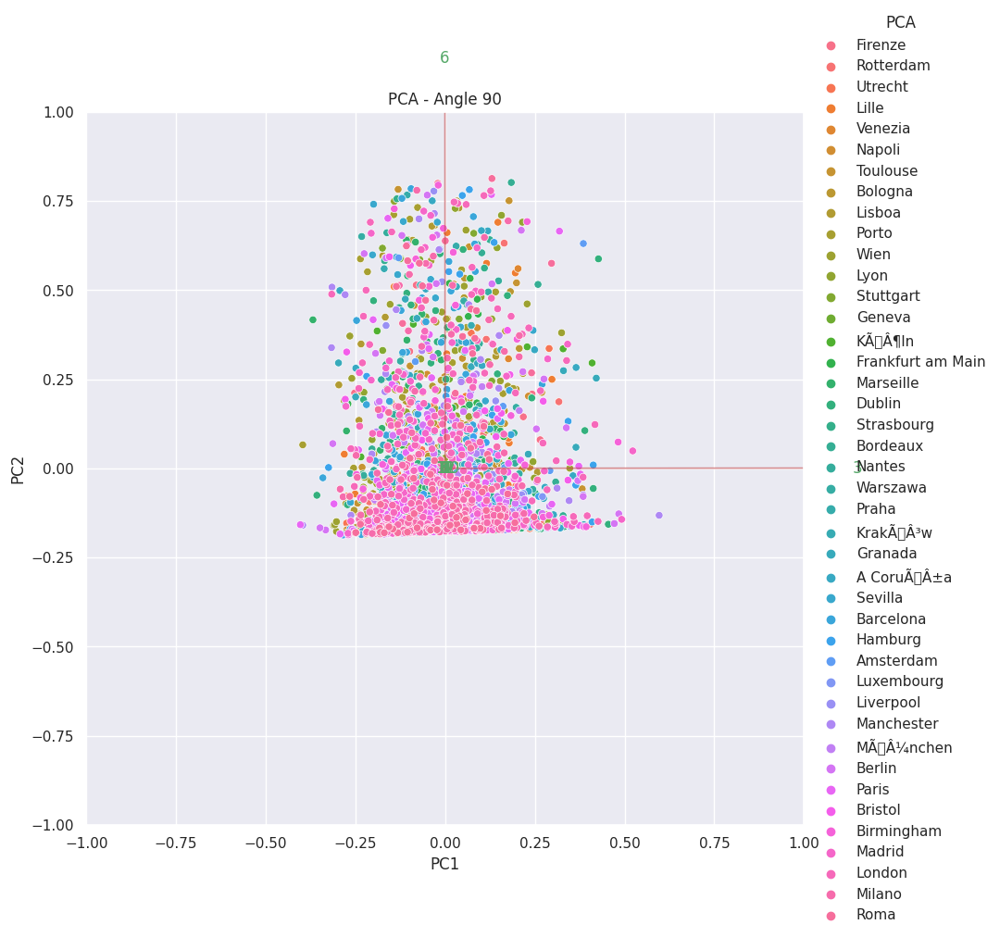

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 131 (\x83) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


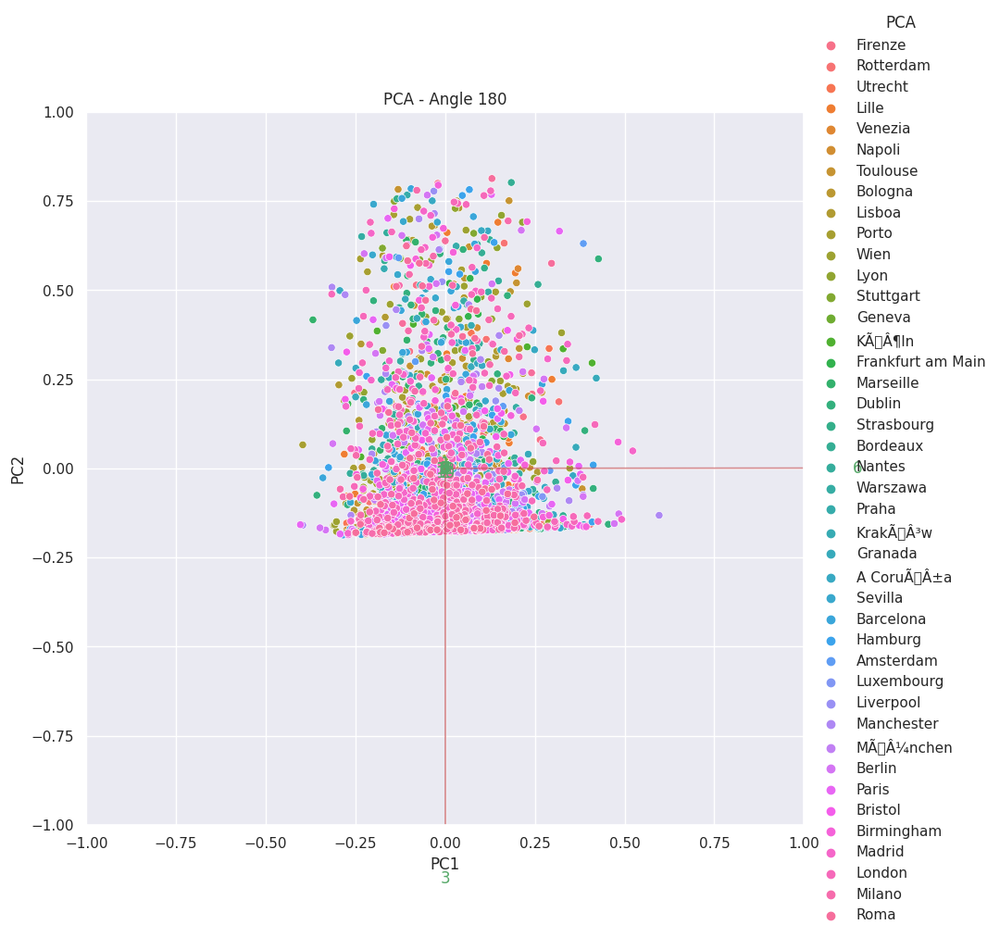

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 131 (\x83) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


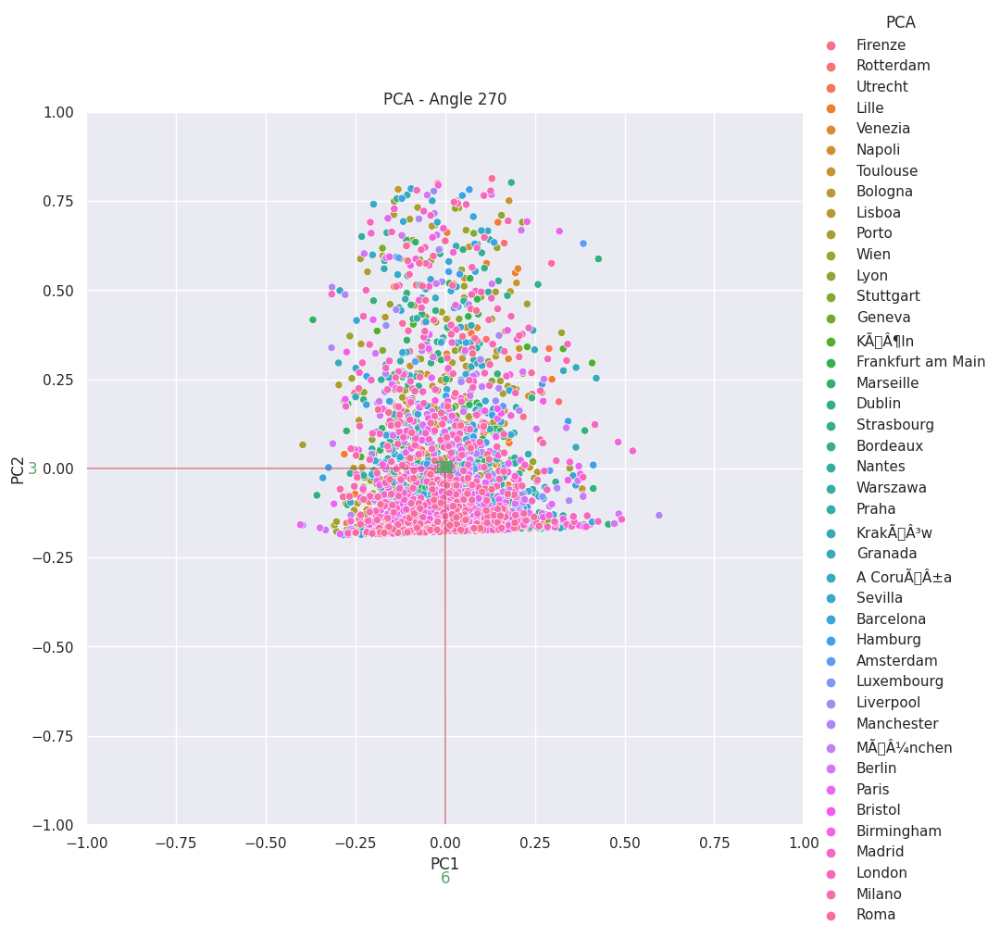

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Assuming 'data_num_reduced_df' is your DataFrame after applying PCA and 'model' is your trained PCA model

# Add 'city' column to 'data_num_reduced_df' from the original DataFrame (replace 'original_df' with the name of your original DataFrame)
data_num_reduced_df['city'] = new_df['city']

# Define a function to plot PCA components from different perspectives
def plot_pca_perspectives(df, components, scale, labels=None, angles=[0, 90, 180, 270]):
    n = components.shape[0]
    if scale == True:
        scalex = 1.0/(df["xs"].max() - df["xs"].min())
        scaley = 1.0/(df["ys"].max() - df["ys"].min())

        df["xs"] = scalex *  df["xs"]
        df["ys"] = scaley * df["ys"]

    for angle in angles:
        plt.figure(figsize=(10, 10))
        plt.xlim(-1,1)
        plt.ylim(-1,1)
        plt.xlabel("PC{}".format(1))
        plt.ylabel("PC{}".format(2))

        # Rotate the components
        theta = np.radians(angle)
        rot_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                               [np.sin(theta),  np.cos(theta)]])
        rot_components = np.dot(components, rot_matrix)

        g = sns.scatterplot(x='xs', y='ys', hue='city', data=df)  # Color points by 'city'
        g.legend(title="PCA", loc='center left', bbox_to_anchor=(1, 0.5), ncol=1, frameon=False)

        for i in range(n):
            plt.arrow(0, 0, rot_components[i,0], rot_components[i,1], color='r', alpha=0.5)
            if labels is None:
                plt.text(rot_components[i,0]*1.15, rot_components[i,1]*1.15, df.columns[i], color='g', ha='center', va='center', alpha=0.5)
            else:
                plt.text(rot_components[i,0]*1.15, rot_components[i,1]*1.15, labels[i], color='g', ha='center', va='center')

        plt.title(f'PCA - Angle {angle}')
        plt.show()

# Run the function
plot_pca_perspectives(data_num_reduced_df, np.transpose(model.components_[0:2, :]), True, labels=data_num_reduced_df.columns)


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Define a function to plot PCA components from different perspectives
def plot_3d_pca(df, components, labels=None):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Use LabelEncoder to convert time_of_day values to numeric values
    le = LabelEncoder()
    df['time_of_day'] = le.fit_transform(df['time_of_day'])

    xs = df[df.columns[0]]
    ys = df[df.columns[1]]
    zs = df[df.columns[2]]

    scatter = ax.scatter(xs, ys, zs, c=df['time_of_day'], cmap='viridis')  # Color points by 'time_of_day'
    legend1 = ax.legend(*scatter.legend_elements(num=len(le.classes_)), title="Time of Day", loc='upper right')
    ax.add_artist(legend1)

    for i in range(components.shape[0]):
        ax.quiver(0, 0, 0, components[i,0], components[i,1], components[i,2], color='r')
        if labels is None:
            ax.text(components[i,0], components[i,1], components[i,2], df.columns[i], color='b')
        else:
            ax.text(components[i,0], components[i,1], components[i,2], labels[i], color='b')

    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")
    plt.title('PCA - 3D Plot')
    plt.show()

# Run the function
plot_3d_pca(data_num_reduced_df, np.transpose(model.components_[0:3, :]), labels=data_num_reduced_df.columns)


In [ ]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from mpl_toolkits.mplot3d import Axes3D

# Define a function to plot PCA components from different perspectives
def plot_3d_pca(df, components, labels=None):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Use LabelEncoder to convert sentiment values to numeric values
    sentiment_mapping = {'Positive': 2, 'Neutral': 1, 'Negative': 0}
    df['Sentiment'] = df['Sentiment'].map(sentiment_mapping)

    xs = df[df.columns[0]]
    ys = df[df.columns[1]]
    zs = df[df.columns[2]]

    scatter = ax.scatter(xs, ys, zs, c=df['Sentiment'], cmap='viridis')  # Color points by 'Sentiment'
    legend1 = ax.legend(*scatter.legend_elements(num=len(sentiment_mapping)), title="Sentiment", loc='upper right')
    ax.add_artist(legend1)

    for i in range(components.shape[0]):
        ax.quiver(0, 0, 0, components[i,0], components[i,1], components[i,2], color='r')
        if labels is None:
            ax.text(components[i,0], components[i,1], components[i,2], df.columns[i], color='b')
        else:
            ax.text(components[i,0], components[i,1], components[i,2], labels[i], color='b')

    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")
    plt.title('PCA - 3D Plot')
    plt.show()

# Run the function
plot_3d_pca(data_num_reduced_df, np.transpose(model.components_[0:3, :]), labels=data_num_reduced_df.columns)


In [ ]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from mpl_toolkits.mplot3d import Axes3D

# Define a function to plot PCA components from different perspectives
def plot_3d_pca(df, components, original_df, count_column='Amenities_Total_Count', labels=None):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Normalize 'Amenities_Total_Count' to a scale of 0 to 1
    scaler = MinMaxScaler()
    original_df[count_column] = scaler.fit_transform(original_df[[count_column]])

    xs = df[df.columns[0]]
    ys = df[df.columns[1]]
    zs = df[df.columns[2]]

    scatter = ax.scatter(xs, ys, zs, c=original_df[count_column], cmap='viridis')  # Color points by 'Amenities_Total_Count'
    fig.colorbar(scatter)

    for i in range(components.shape[0]):
        ax.quiver(0, 0, 0, components[i,0], components[i,1], components[i,2], color='r')
        if labels is None:
            ax.text(components[i,0], components[i,1], components[i,2], df.columns[i], color='b')
        else:
            ax.text(components[i,0], components[i,1], components[i,2], labels[i], color='b')

    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")
    plt.title('PCA - 3D Plot')
    plt.show()

# Run the function
plot_3d_pca(data_num_reduced_df, np.transpose(model.components_[0:3, :]), new_df, count_column='Amenities_Total_Count', labels=data_num_reduced_df.columns)



The important features are the ones that influence more the components and thus, have a large absolute value/score on the component.

In [83]:
pcscores = pd.DataFrame(data_reduced)
loadings = pd.DataFrame(model.components_, columns=data_num.columns)
loadings.index = ['PC'+str(i+1) for i in range(len(pcscores.columns))]

In [84]:
pcscores

,0,1,2,3,4,5,6,7
0,2.154,-0.105,0.320,-0.497,0.189,-0.173,0.020,0.003
1,2.474,-0.091,-0.650,-0.287,0.071,-0.178,0.026,0.005
2,3.994,2.226,-0.267,-0.126,0.838,-0.016,0.302,-0.083
3,3.269,2.187,1.930,-0.548,1.115,-0.005,0.290,-0.089
4,3.785,2.391,0.595,-0.281,0.935,-0.007,0.292,-0.084
...,...,...,...,...,...,...,...,...
24142,-2.493,-0.975,-0.948,-1.018,-0.558,0.693,-0.375,-0.022
24143,0.449,-0.341,-1.429,0.896,1.657,-0.339,-0.105,0.012
24144,-3.516,-1.200,0.936,2.625,-0.375,-0.017,0.040,-0.068
24145,-3.549,-1.172,1.074,2.601,-0.360,-0.016,0.038,-0.069


In [85]:
# Write the DataFrame to a CSV file
pcscores.to_csv('/content/drive/MyDrive/Session CSVs/pcscores_studio_proper', index=False)


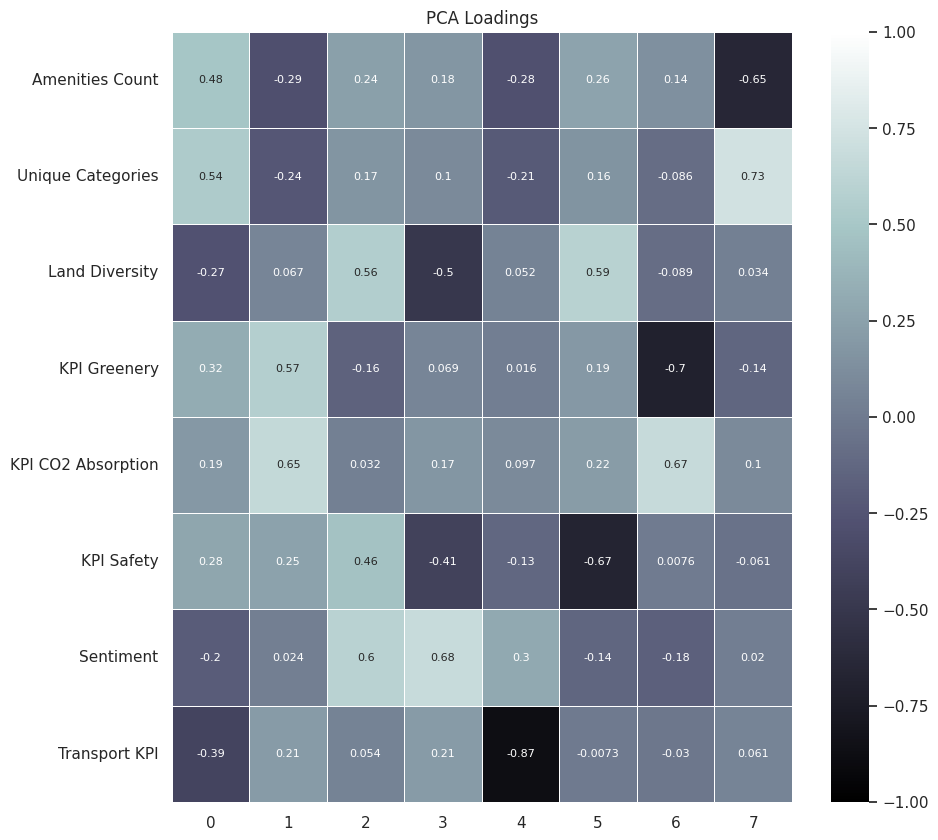

In [86]:
# Create a DataFrame from the PCA components
loadings = pd.DataFrame(pca.components_, columns=data_num.columns)

# Display the heatmap
plt.figure(figsize=(10,10))
sns.heatmap(loadings.transpose(), center=0, linewidths=0.5, cmap="bone", vmin=-1, vmax=1, annot=True, annot_kws={"size": 8})
plt.title('PCA Loadings')
plt.show()


# kmeans

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

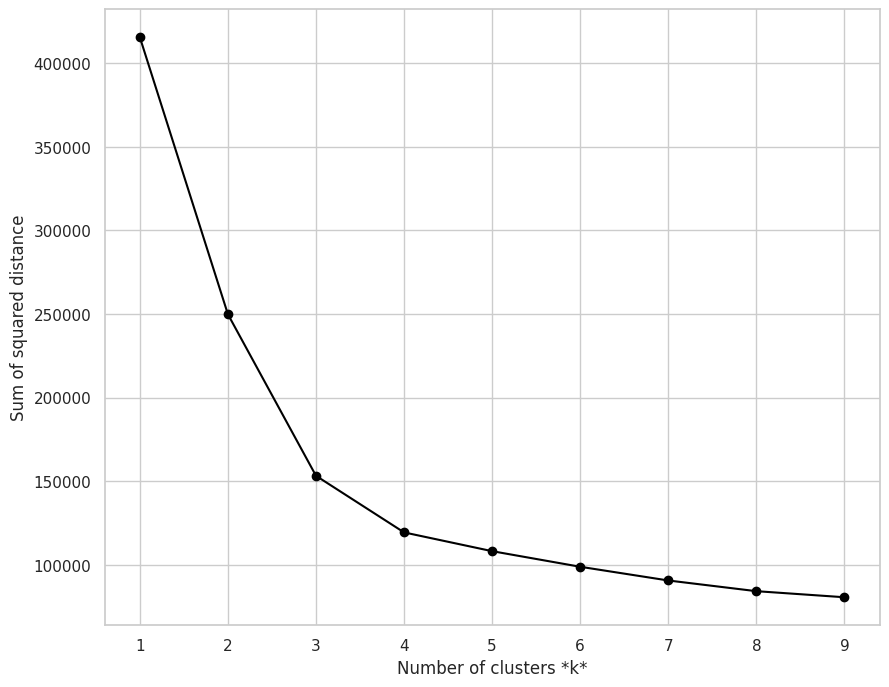

In [87]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Elbow Method for determining the optimal number of clusters
sse = []
list_k = list(range(1, 10))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(pcscores)
    sse.append(km.inertia_)

# Set plot style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(10, 8))

# Plot sse against k with a black line
plt.plot(list_k, sse, '-o', color='black')
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance')

# Show the plot
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


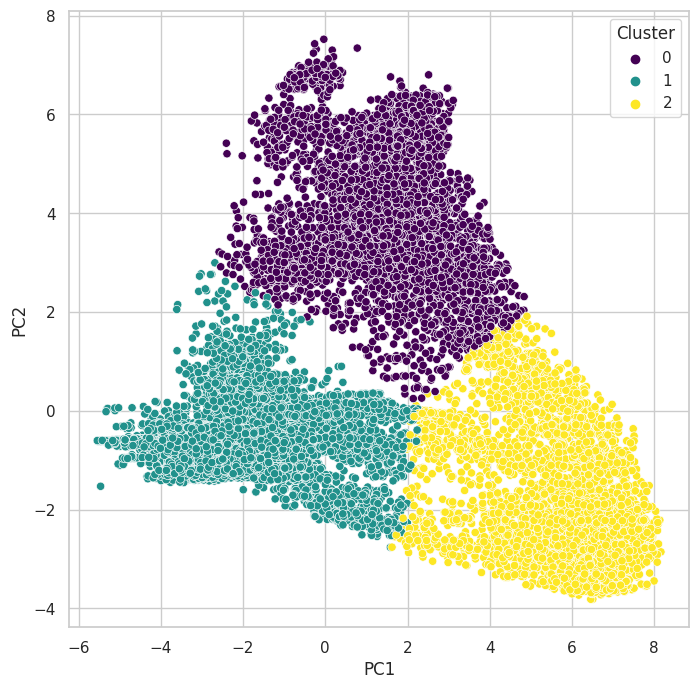

In [88]:
column_names = {i: 'PC'+str(i+1) for i in range(13)}  # Create a dictionary with the new column names
pcscores.rename(columns=column_names, inplace=True)  # Rename the columns in-place

from sklearn.cluster import KMeans

# Find clusters
kmeans = KMeans(n_clusters=3, random_state=42)  # Use the number of clusters that is most suitable for your dataset
pcscores['Cluster'] = kmeans.fit_predict(pcscores)

# Visualizing the clusters (if you have more than 2 PCs, select two for visualization)
plt.figure(figsize=(8, 8))
sns.scatterplot(data=pcscores, x='PC1', y='PC2', hue='Cluster', palette='viridis')
plt.show()


In [92]:
# Append the cluster labels to the original dataframe
data['Cluster'] = pcscores['Cluster']

# Create separate dataframes for each cluster
cluster_1 = data[data['Cluster'] == 0]
cluster_2 = data[data['Cluster'] == 1]
cluster_3 = data[data['Cluster'] == 2]


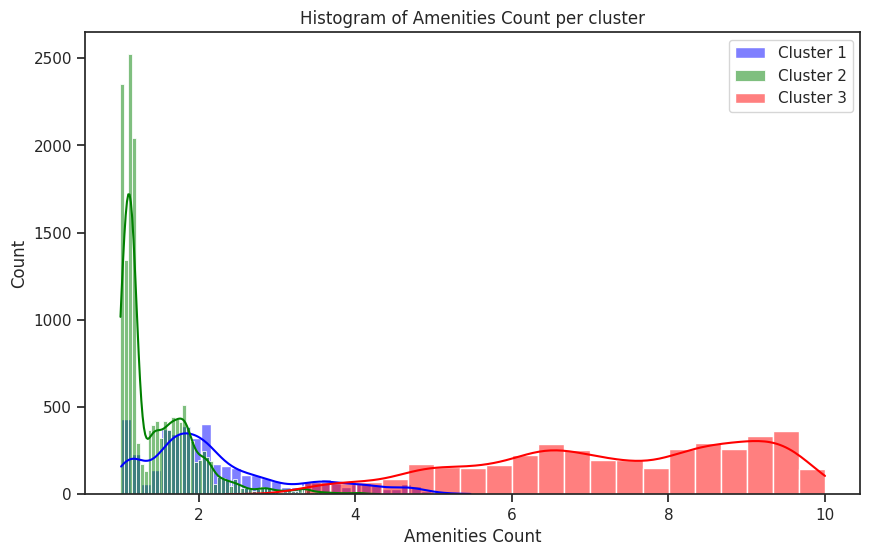

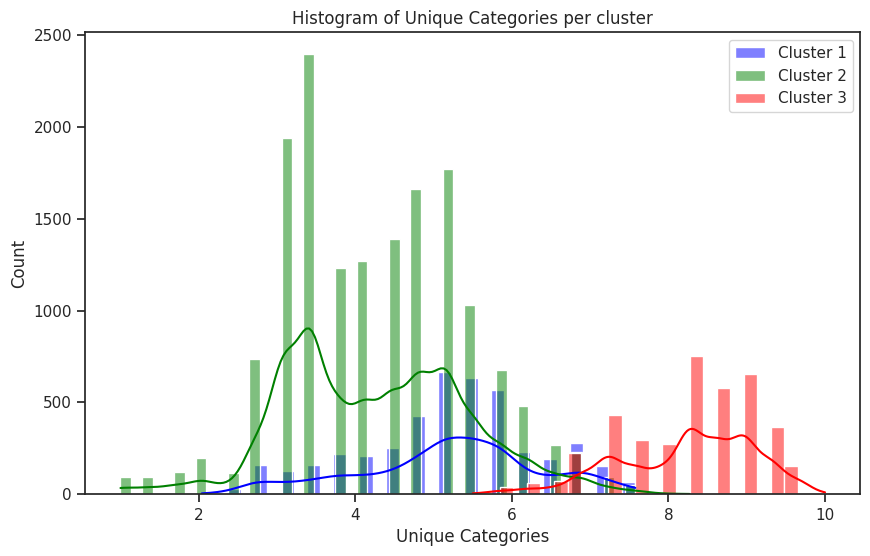

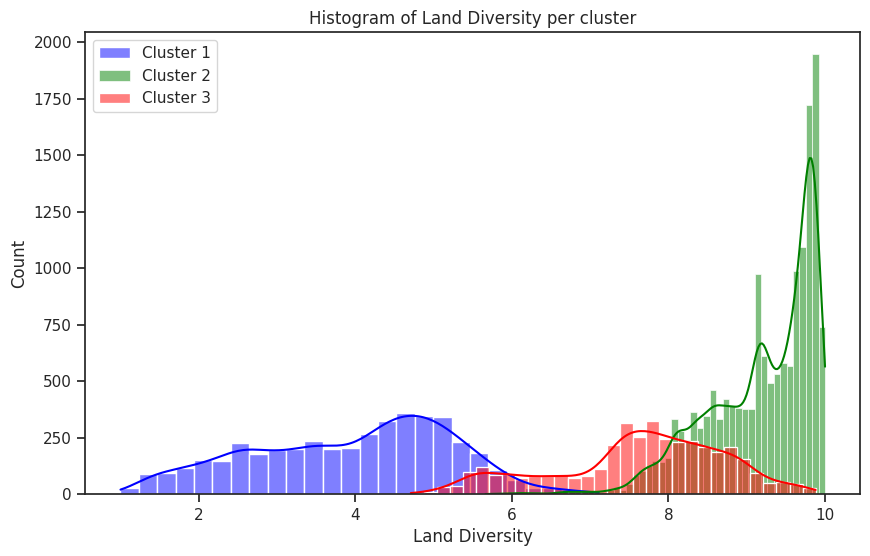

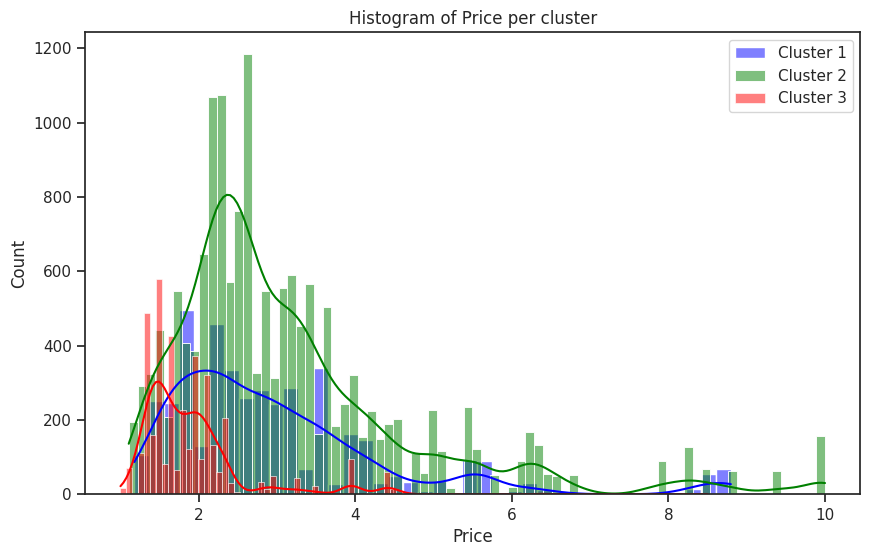

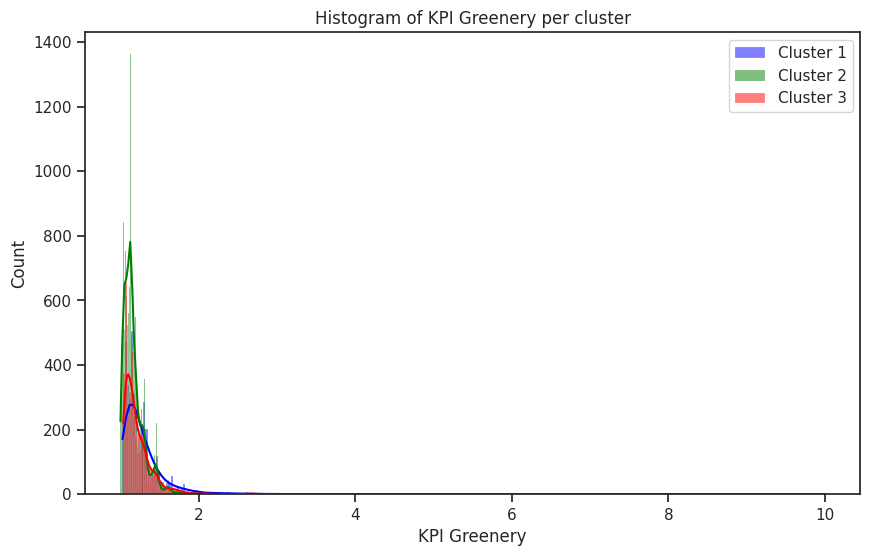

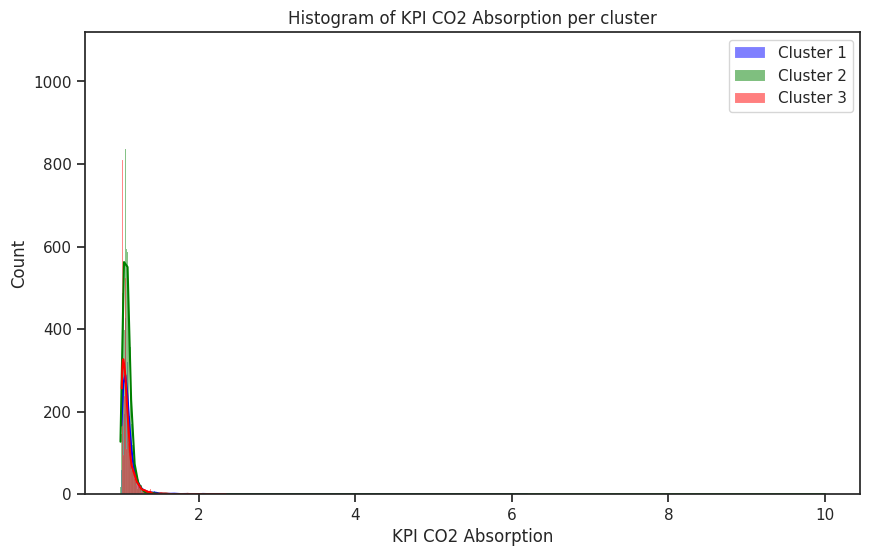

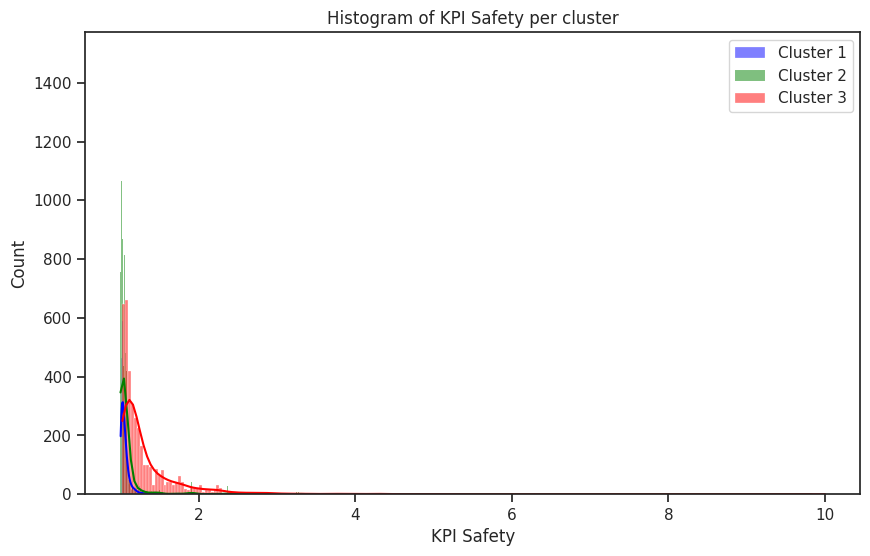

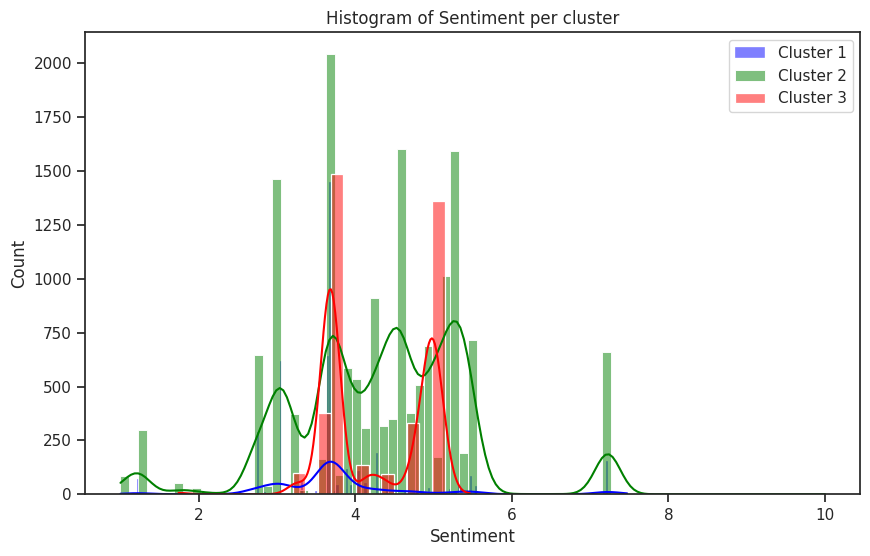

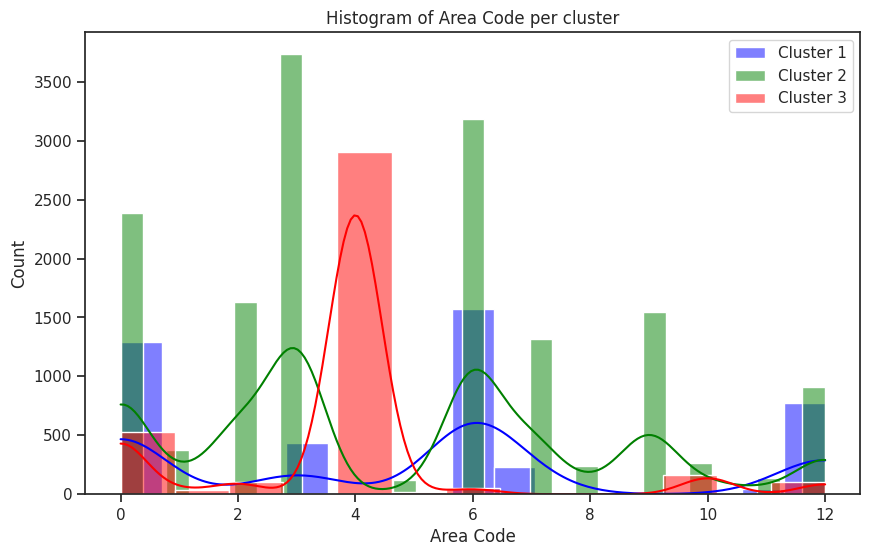

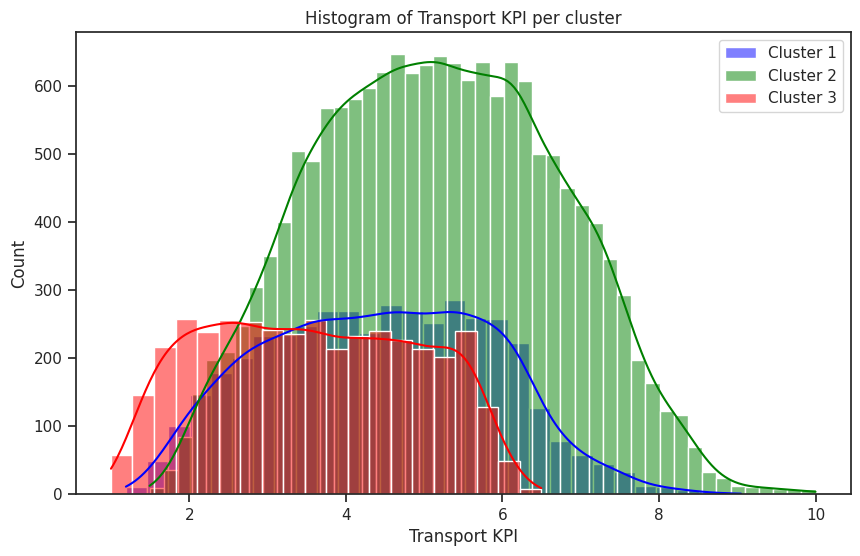

In [93]:
# Define the cluster dataframes as per your last instruction
# cluster_1 = new_df[new_df['Cluster'] == 0]
# cluster_2 = new_df[new_df['Cluster'] == 1]
# cluster_3 = new_df[new_df['Cluster'] == 2]

# Define a list of colors for each cluster
colors = ['blue', 'green', 'red']

# Loop over the features you're interested in
for feature in data.select_dtypes(include=np.number).columns.tolist():
    if feature != "Cluster":  # we don't want to plot the Cluster feature itself
        plt.figure(figsize=(10, 6))

        # Create a histogram for each cluster
        for i, cluster in enumerate([cluster_1, cluster_2, cluster_3]):
            sns.histplot(data=cluster, x=feature, color=colors[i], kde=True, label=f'Cluster {i+1}')

        # Add title and show the plot with legend
        plt.title(f'Histogram of {feature} per cluster')
        plt.legend()
        plt.show()


<ipython-input-94-0dc251f4dc54>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['Cluster'] = subset['Cluster'].astype('category')


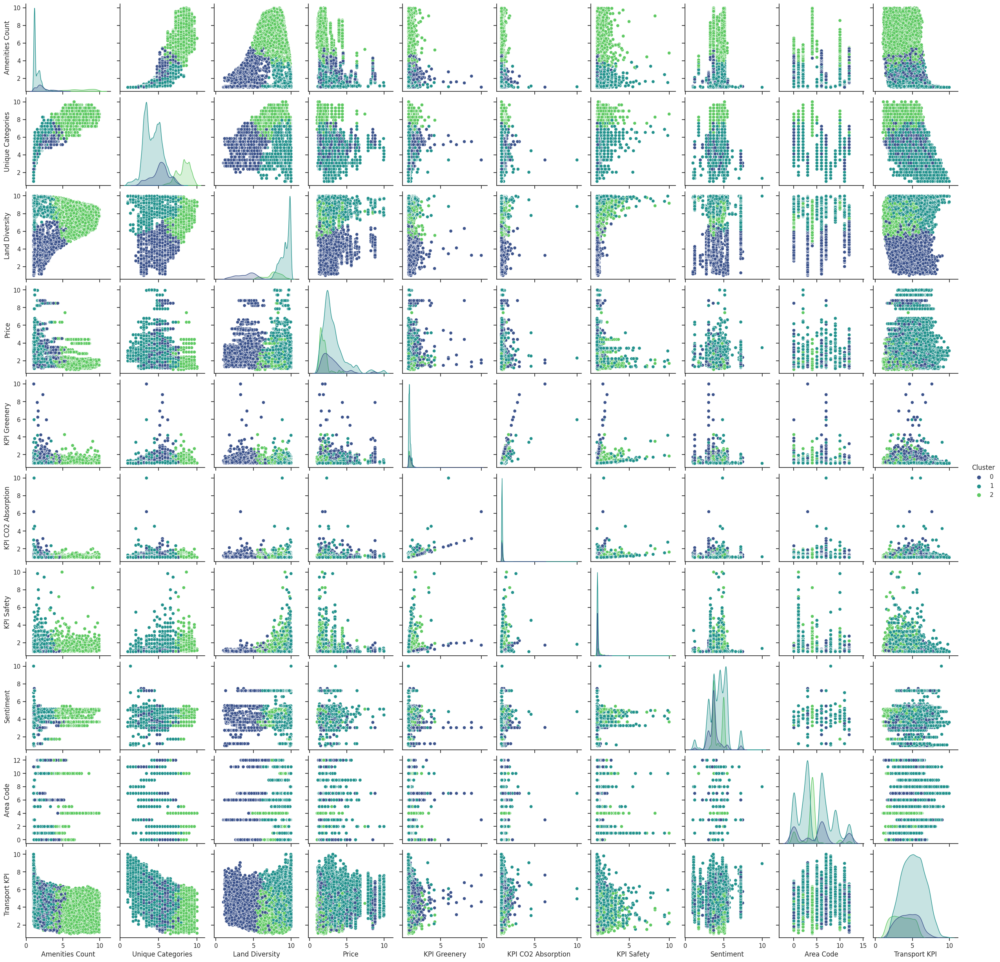

In [94]:
# Make sure to import seaborn
import seaborn as sns

# Set the style of the visualization
sns.set(style="ticks")

# Select only the numeric columns (excluding the 'Cluster' column)
numeric_columns = [col for col in data.columns if data[col].dtype in ['int64', 'float64'] and col != 'Cluster']

# Make a subset of the DataFrame with these columns, and the 'Cluster' column
subset = data[numeric_columns + ['Cluster']]

# Convert the 'Cluster' column to a categorical type, so it's treated properly in the plot
subset['Cluster'] = subset['Cluster'].astype('category')

# Make the pair plot
sns.pairplot(subset, hue='Cluster', palette='viridis')


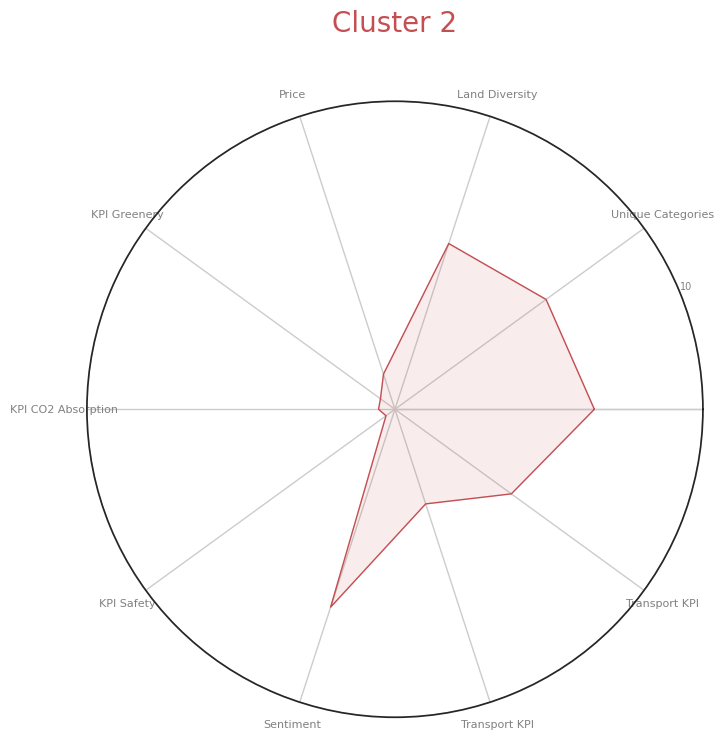

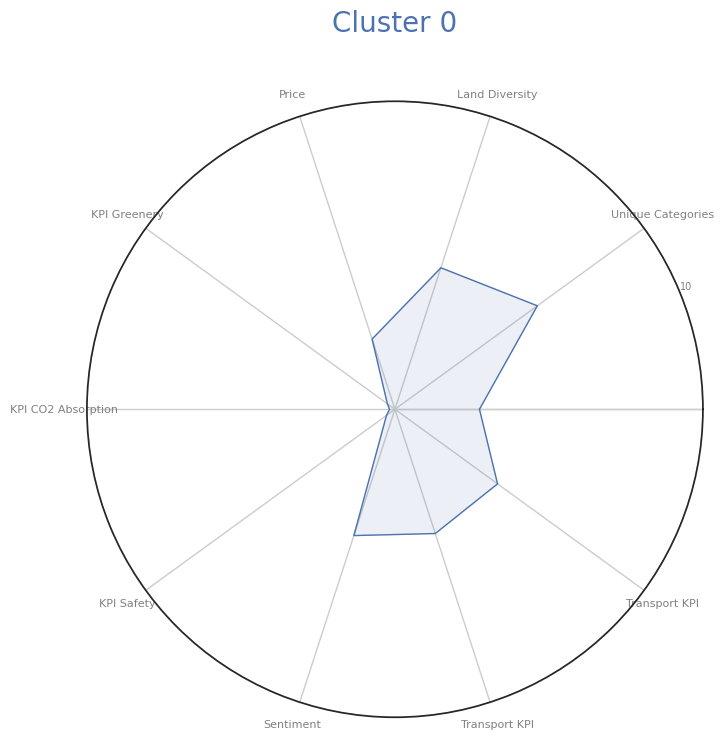

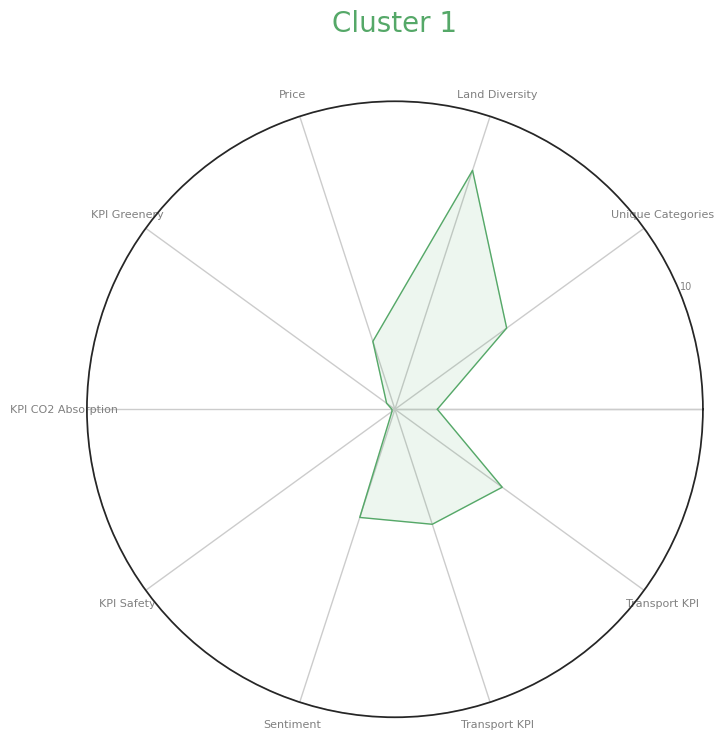

In [113]:
# Unique cluster labels
cluster_labels = data['Cluster'].unique()

# Your custom labels
new_labels = ['Amenities Count', 'Unique Categories', 'Land Diversity', 'Price',
              'KPI Greenery', 'KPI CO2 Absorption', 'KPI Safety', 'Sentiment', 'Transport KPI']

# If there are less custom labels than columns, fill the rest with column names
if len(new_labels) < len(subset.columns):
    new_labels += list(subset.columns)[len(new_labels):]

# Add an extra empty label if needed to close the circular graph
if len(new_labels) < len(subset.columns) + 1:
    new_labels += [""]

# Iterate through clusters
for cluster in cluster_labels:
    subset = data[data['Cluster'] == cluster]  # Subset the original DataFrame based on the cluster
    subset = subset.select_dtypes(include=[np.number])  # Keep only numeric columns
    subset = subset.drop(columns=['Cluster'])  # Exclude 'Cluster' column

    # Normalize
    subset_scaled = pd.DataFrame(scaler.fit_transform(subset), columns=subset.columns)

    # Calculate means
    means = subset_scaled.mean().tolist()
    means += means[:1]  # Repeat first value to close circular graph

    # Calculate angles for each axis
    angles = [n / float(len(means)-1) * 2 * np.pi for n in range(len(means)-1)]
    angles += angles[:1]  # Repeat first angle to close circular graph

    # Create radar chart
    plt.figure(figsize=(8, 8))  # Create a new figure for each cluster
    ax = plt.subplot(111, polar=True)

    plt.xticks(angles, new_labels, color='grey', size=8)
    plt.yticks([10 * i for i in range(1, 11)], [str(10 * i) for i in range(1, 11)], color="grey", size=7)
    plt.ylim(0, 10)
    ax.plot(angles, means, linewidth=1, linestyle='solid', color=colors[cluster])
    ax.fill(angles, means, color=colors[cluster], alpha=0.1)
    plt.title('Cluster ' + str(cluster), size=20, color=colors[cluster], y=1.1)

    plt.show()


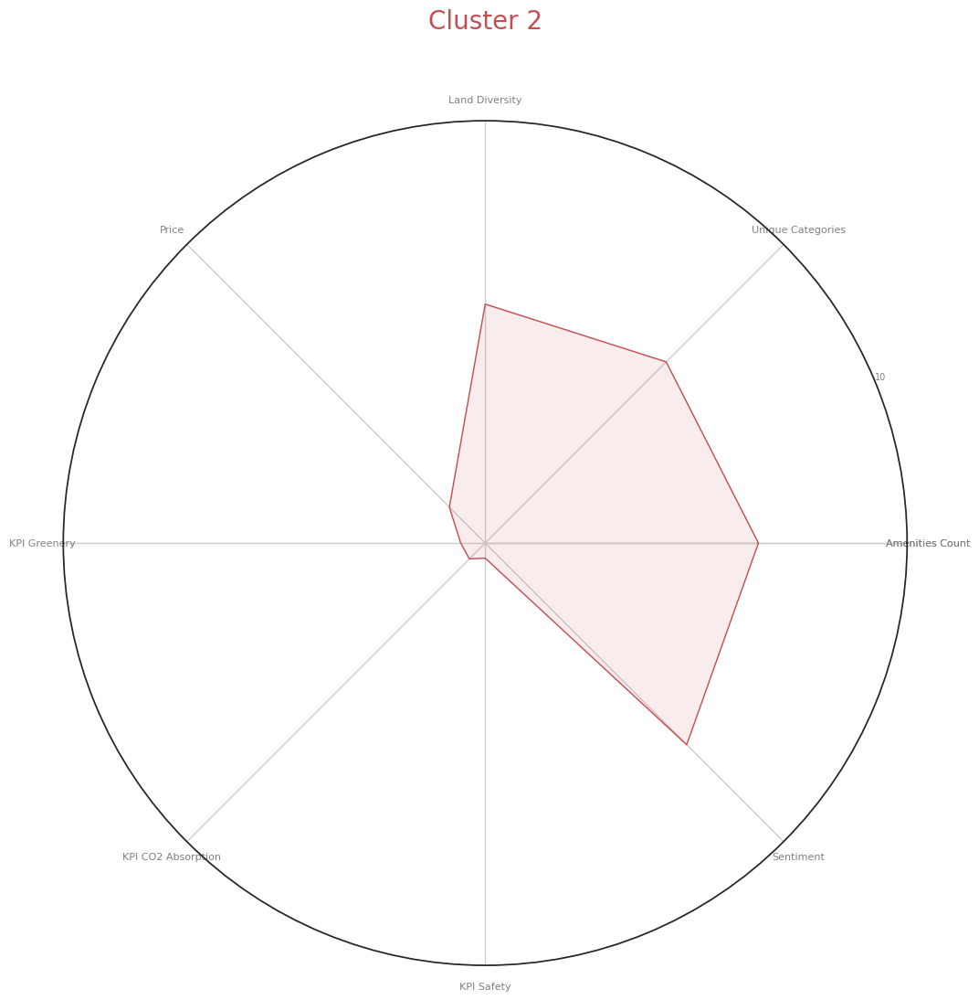

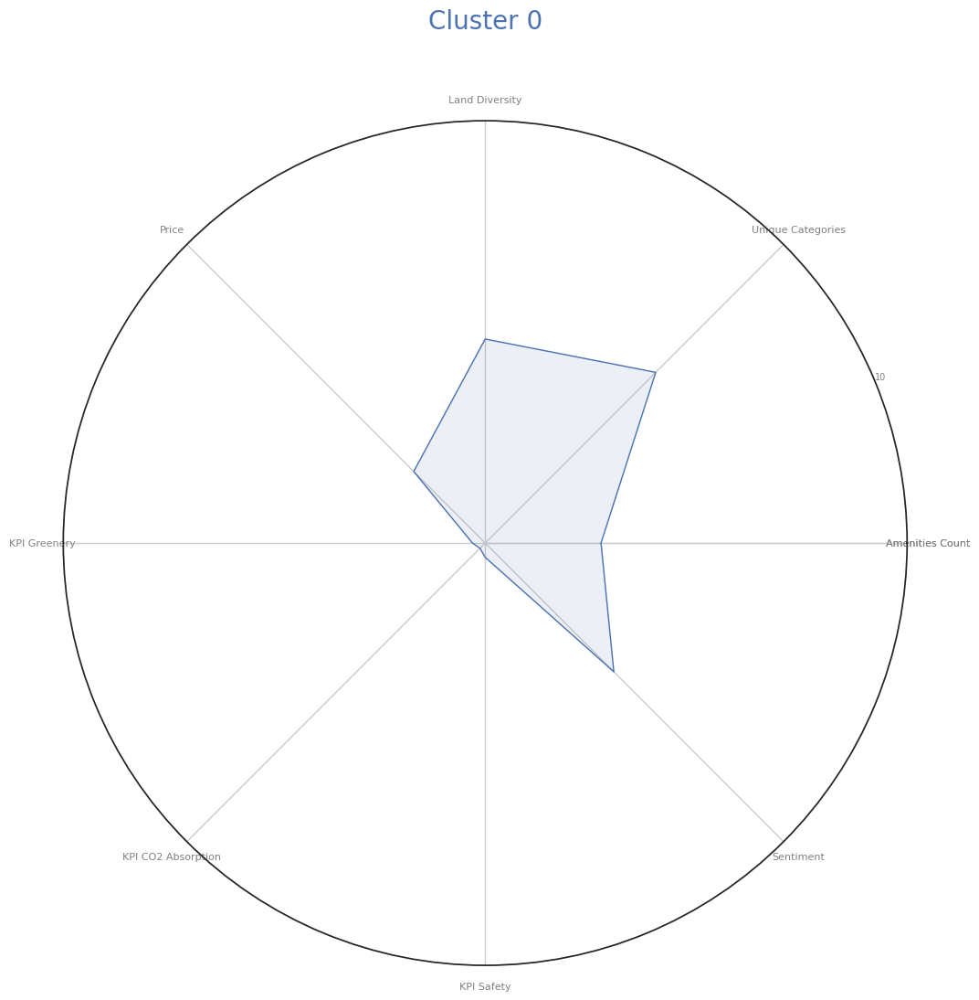

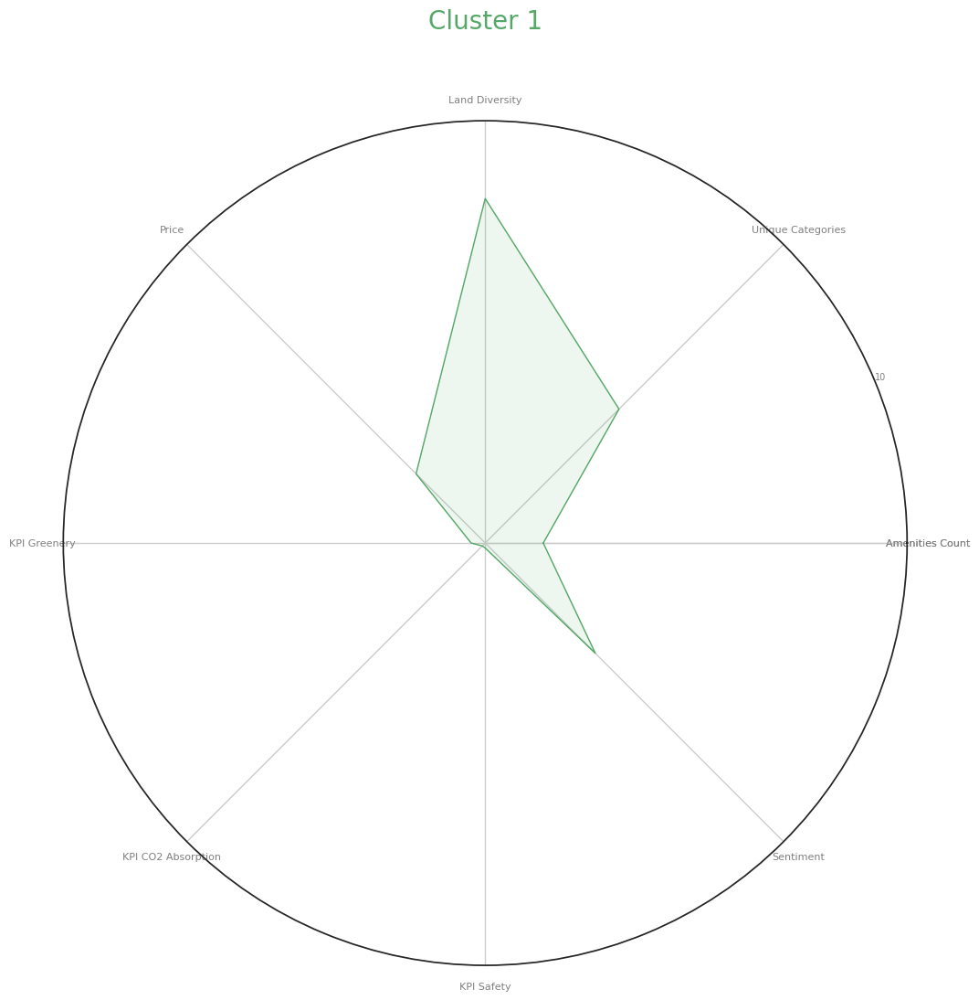

In [123]:
# Rename columns in the dataframe as per your requirements
data.rename(columns={
    'Amenities_Count_1000': 'Amenities Count',
    'Unique_Categories_1000': 'Unique Categories',
    'Land_Diversity_1000': 'Land Diversity',
    'Price': 'Price',
    'KPI Greenery': 'KPI Greenery',
    'KPI CO2 Absorption': 'KPI CO2 Absorption',
    'KPI Safety': 'KPI Safety',
    'Sentiment_Score': 'Sentiment'
}, inplace=True)

# Custom labels list
custom_labels = ['Amenities Count', 'Unique Categories', 'Land Diversity', 'Price',
              'KPI Greenery', 'KPI CO2 Absorption', 'KPI Safety', 'Sentiment']
custom_labels += custom_labels[:1]  # Repeat first label to close circular graph

# Unique cluster labels
cluster_labels = data['Cluster'].unique()

# Iterate through clusters
for cluster in cluster_labels:
    subset = data[data['Cluster'] == cluster]  # Subset the original DataFrame based on the cluster
    subset = subset[custom_labels[:-1]]  # Only select columns present in the custom_labels list

    # Normalize
    subset_scaled = pd.DataFrame(scaler.fit_transform(subset), columns=subset.columns)

    # Calculate means
    means = subset_scaled.mean().tolist()
    means += means[:1]  # Repeat first value to close circular graph

    # Calculate angles for each axis
    angles = [n / float(len(means)-1) * 2 * np.pi for n in range(len(means)-1)]
    angles += angles[:1]  # Repeat first angle to close circular graph

    # Create radar chart
    plt.figure(figsize=(12, 12))  # Create a new figure for each cluster
    ax = plt.subplot(111, polar=True)

    plt.xticks(angles, custom_labels, color='grey', size=8)
    plt.yticks([10 * i for i in range(1, 11)], [str(10 * i) for i in range(1, 11)], color="grey", size=7)
    plt.ylim(0, 10)
    ax.plot(angles, means, linewidth=1, linestyle='solid', color=colors[cluster])
    ax.fill(angles, means, color=colors[cluster], alpha=0.1)
    plt.title('Cluster ' + str(cluster), size=20, color=colors[cluster], y=1.1)
    plt.grid(True)  # Add grid

    plt.show()


In [ ]:
# Path to the Google Drive folder
path = '/content/drive/MyDrive/Data - Encoding - Group/'

# Save DataFrame to CSV
pcscores.to_csv(path + 'pcscores.csv', index=False)


# rest

In [42]:
# number of components
n_pcs= model.components_.shape[0]

# get the index of the most important feature on EACH component
# LIST COMPREHENSION HERE
most_important = [np.abs(model.components_[i]).argmax() for i in range(n_pcs)]

initial_feature_names = data_num.columns
# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]

# LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

# build the dataframe
df = pd.DataFrame(dic.items())

print(df)

     0                   1
0  PC0     Amenities Count
1  PC1      Land Diversity
2  PC2               Price
3  PC3       Transport KPI
4  PC4           Sentiment
5  PC5   Unique Categories
6  PC6          KPI Safety
7  PC7        KPI Greenery
8  PC8  KPI CO2 Absorption


## FAMD analysis

In [ ]:
! pip install prince

In [ ]:
#Add categorical values to the data

islands = ["australia", "britain", "bahamas"]
color= ["red", "purple"]

data_mix = data
data_mix["island"] = np.random.choice(islands,len(data_mix))
data_mix["color"] = np.random.choice(color, len(data_mix))
#data_mix = data_mix.drop(columns = "species")
print(data_mix)

In [ ]:
import prince
famd = prince.FAMD(n_components=6, n_iter=3, copy=True, check_input=True, engine="sklearn", random_state=42)
famd = famd.fit(data_mix)

In [ ]:
data_famd_reduced_df = pd.DataFrame(famd.row_coordinates(data_mix))
print(data_famd_reduced_df)

In [ ]:
data_famd_reduced_df["species"] = data["species"]

In [ ]:
a = sns.relplot(x= 0,y=1, data=data_famd_reduced_df, hue = "species", height = 8)
plt.xlabel("Component{}".format(1))
plt.ylabel("Component{}".format(2))

TSNE

In [ ]:
# Replace the link with your own link
file_url = "/content/drive/MyDrive/Data - Encoding - Group/sentigroup_1"

new_df = pd.read_csv(file_url)

In [ ]:
from sklearn.manifold import TSNE

In [ ]:
new_df.columns

Index(['Unnamed: 0', 'city', 'area', 'Vegetation_Cover',
       'Amenities_Total_Count', 'park_name', 'reviews_count',
       'weighted_rating', 'sentiment_score', 'avg_review_time',
       'Amenities_Diversity_Shannon', 'Amenities_Diversity', 'Shape_Deviation',
       'Urban_Circulation_Amenities', 'Cultural_Context', 'Urban_Features'],
      dtype='object')

In [ ]:
def classify_sentiment(score):
    if score > 0.5:
        return 'positive'
    elif score < -0.5:
        return 'negative'
    else:
        return 'neutral'

new_df['sentiment'] = new_df['sentiment_score'].apply(classify_sentiment)

def classify_time_of_day(time):
    if 6 <= time < 12:
        return 'morning'
    elif 12 <= time < 14:
        return 'noon'
    elif 14 <= time < 18:
        return 'afternoon'
    elif 18 <= time < 21:
        return 'evening'
    else:
        return 'night'

# Convert seconds from midnight to hours
new_df['avg_review_time'] = new_df['avg_review_time'] / 3600

new_df['time_of_day'] = new_df['avg_review_time'].apply(classify_time_of_day)


In [ ]:
new_df

,Unnamed: 0,city,area,Vegetation_Cover,Amenities_Total_Count,park_name,reviews_count,weighted_rating,sentiment_score,avg_review_time,Amenities_Diversity_Shannon,Amenities_Diversity,Shape_Deviation,Urban_Circulation_Amenities,Cultural_Context,Urban_Features,sentiment,time_of_day
0,2,Firenze,0.027,17.131,25,Lippi's Garden,40,4.066,0.997,10.797,0.168,0.111,0.529,25,0,0,positive,morning
1,6,Firenze,0.020,3.936,17,Parco D'Arte Enzo Pazzagli,752,4.063,0.995,15.221,0.691,0.111,0.472,8,0,9,positive,afternoon
2,12,Firenze,0.002,27.566,57,Piazza Giacomo Puccini,13,4.036,0.575,11.690,0.743,0.278,0.833,11,1,45,positive,morning
3,20,Firenze,0.018,1.126,38,Parco Bardo,67,4.050,0.974,14.093,0.822,0.222,0.449,8,1,29,positive,afternoon
4,28,Firenze,0.004,83.474,23,Giardino Ex Caterina De' Medici,5,4.043,-0.309,15.623,1.214,0.278,0.474,10,0,13,neutral,afternoon
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,2713,Roma,0.005,9.804,63,Giardino Monsignor Desiderio Nobels,59,3.830,0.992,13.249,1.027,0.389,0.453,18,2,43,positive,noon
394,2718,Roma,0.003,0.371,12,Parco della Pace tra i Popoli,13,3.824,0.590,19.087,1.234,0.278,0.432,7,0,5,positive,evening
395,2725,Roma,0.002,0.130,18,Giardino Willy Duarte Monteiro,635,3.962,0.999,12.504,0.530,0.111,0.442,14,0,4,positive,noon
396,2737,Roma,0.083,14.046,20,Parco Bonafede,132,3.853,0.221,10.521,0.199,0.111,0.532,19,0,1,neutral,morning


In [ ]:
new_df.describe()

In [ ]:
tsne = TSNE(n_components=2, n_iter=3000, random_state=42)
points = tsne.fit_transform(data_scaled)

data_TSNE = pd.DataFrame(points, columns=["TSNE1", "TSNE2"])  # Name the columns resulting from TSNE

# Now add the other columns
columns_to_add = ["reviews_count", "weighted_rating", "sentiment_score"]

for column in columns_to_add:
    data_TSNE[column] = new_df[column]


In [ ]:
print(data_TSNE.columns)


Index(['TSNE1', 'TSNE2', 'reviews_count', 'weighted_rating',
       'sentiment_score'],
      dtype='object')


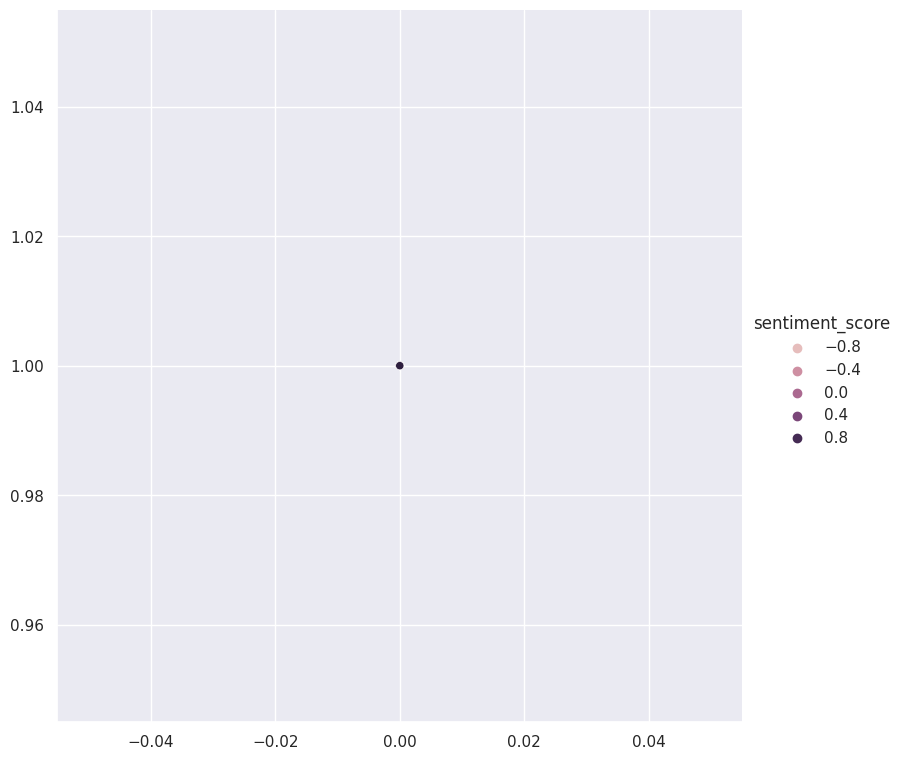

In [ ]:
a = sns.relplot(x=0,y=1, data = data_TSNE, hue = 'sentiment_score', height = 8)

# Spiderplots

In [ ]:
# Replace the link with your own link
file_url = "/content/drive/MyDrive/Data - Encoding - Group/ALL_PARKS_TRAINING_5.csv"

new_df = pd.read_csv(file_url)

In [ ]:
new_df.columns

Index(['city', 'area', 'Vegetation_Cover', 'Amenities_Total_Count',
       'park_name', 'reviews_count', 'weighted_rating', 'sentiment_score',
       'Sentiment', 'avg_review_time', 'time_of_day',
       'Amenities_Diversity_Shannon', 'Amenities_Diversity', 'Shape_Deviation',
       'Urban_Circulation_Amenities', 'Cultural_Context', 'Urban_Features'],
      dtype='object')

In [ ]:
new_df.describe()

,area,Vegetation_Cover,Amenities_Total_Count,reviews_count,weighted_rating,sentiment_score,avg_review_time,Amenities_Diversity_Shannon,Amenities_Diversity,Shape_Deviation,Urban_Circulation_Amenities,Cultural_Context,Urban_Features
count,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000,3407.000
mean,0.033,28.622,37.552,214.316,4.077,0.863,50678.307,0.859,0.245,0.457,17.057,1.001,19.494
std,0.091,34.737,34.397,260.710,0.168,0.354,10128.215,0.468,0.130,0.185,18.339,2.016,25.677
min,0.000,0.000,5.000,5.000,3.594,-0.995,7145.000,0.000,0.056,0.000,0.000,0.000,0.000
25%,0.004,1.595,11.000,29.000,3.962,0.932,44451.000,0.500,0.167,0.366,5.000,0.000,2.000
50%,0.010,11.851,24.000,103.000,4.065,0.978,51068.000,0.876,0.222,0.472,11.000,0.000,8.000
75%,0.029,45.608,53.000,304.000,4.211,0.991,57782.000,1.213,0.333,0.562,22.000,1.000,26.500
max,2.347,100.000,146.000,1164.000,4.647,1.000,79960.000,2.114,0.833,0.982,136.000,32.000,134.000


In [ ]:
# Creating a dictionary for the replacements
replacements = {'KrakÃ\x83Â³w': 'Krakow',
                'A CoruÃ\x83Â±a': 'A Coruna',
                'MÃ\x83Â¼nchen': 'Munich',
                'KÃ\x83Â¶ln': 'Koln'}

# Replace the city names in the 'city' column
new_df['city'] = new_df['city'].replace(replacements)

# Check the updated city names
print(new_df['city'].unique())


['Firenze' 'Rotterdam' 'Utrecht' 'Lille' 'Venezia' 'Napoli' 'Toulouse'
 'Bologna' 'Lisboa' 'Porto' 'Wien' 'Lyon' 'Stuttgart' 'Geneva' 'Koln'
 'Frankfurt am Main' 'Marseille' 'Dublin' 'Strasbourg' 'Bordeaux' 'Nantes'
 'Warszawa' 'Praha' 'Krakow' 'Granada' 'A Coruna' 'Sevilla' 'Barcelona'
 'Hamburg' 'Amsterdam' 'Luxembourg' 'Liverpool' 'Manchester' 'Munich'
 'Berlin' 'Paris' 'Bristol' 'Birmingham' 'Madrid' 'London' 'Milano' 'Roma']


In [ ]:
new_df.columns

Index(['city', 'area', 'Vegetation_Cover', 'Amenities_Total_Count',
       'park_name', 'reviews_count', 'weighted_rating', 'sentiment_score',
       'Sentiment', 'avg_review_time', 'time_of_day',
       'Amenities_Diversity_Shannon', 'Amenities_Diversity', 'Shape_Deviation',
       'Urban_Circulation_Amenities', 'Cultural_Context', 'Urban_Features'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# First, let's create city_means again
city_means = new_df.groupby('city').mean().reset_index()

# Renaming column for readability and dropping 'Shannon' column
city_means = city_means.drop('Amenities_Diversity_Shannon', axis=1)

# Recreating city_means_scaled
city_means_scaled = city_means.copy()

# Apply the scaler to all columns except 'city'
scaler = MinMaxScaler(feature_range=(0, 10))  # range to scale to
city_means_scaled[city_means.columns[1:]] = scaler.fit_transform(city_means[city_means.columns[1:]])


<ipython-input-34-5972e434c1e6>:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  city_means = new_df.groupby('city').mean().reset_index()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# New labels as per request. Spaces added for offsetting.
new_labels = ['          Area', '                              Vegetation Percentage', '                    Amenities Count', 'Total Reviews  ',
              '   Weighted Rating                         ', 'Sentiment            ', '   Average Review Time                                        ', 'Amenities Diversity                               ',
              '   Shape Deviation                         ', 'Circulation Elements  ', '                   Cultural Context', '                    Urban Features']

# Creating a color palette
colors = plt.get_cmap('tab10')

for i, row in city_means_scaled.iterrows():
    city = row['city']
    values = row.drop('city').tolist()

    num_vars = len(values)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    values += values[:1]
    angles += angles[:1]

    # First Plot - Each city with a unique color
    fig1, ax1 = plt.subplots(figsize=(12, 12), subplot_kw=dict(polar=True))

    color = colors(i % 10)  # cycle the color every 10 cities
    ax1.fill(angles, values, color=color, alpha=0.25)
    ax1.plot(angles, values, color=color, linewidth=1, linestyle='solid', marker='o', markersize=3)  # added marker 'o' with size 3
    ax1.set_title(city.upper(), pad=50, loc='center', fontsize=12)  # Moved title up with pad=50
    ax1.set_xticks(angles[:-1])
    ax1.set_xticklabels(new_labels, color='black', horizontalalignment='center')  # Offset the labels with horizontalalignment='center'
    ax1.set_yticklabels([])
    ax1.grid(linestyle='dotted')
    ax1.set_rlabel_position(0)
    plt.show()

    # Second Plot - Black background, white/grey lines
    fig2, ax2 = plt.subplots(figsize=(12, 12), subplot_kw=dict(polar=True))
    ax2.fill(angles, values, color='white', alpha=0.25)
    ax2.plot(angles, values, color='grey', linewidth=1, linestyle='solid', marker='o', markersize=3)  # added marker 'o' with size 3
    ax2.set_title(city.upper(), color='white', pad=50, loc='center', fontsize=12)  # Moved title up with pad=50 and set color to white
    ax2.patch.set_facecolor('black')
    fig2.patch.set_facecolor('black')
    ax2.set_xticks(angles[:-1])
    ax2.set_xticklabels(new_labels, color='white', horizontalalignment='center')  # Offset the labels with horizontalalignment='center'
    ax2.set_yticklabels([])
    ax2.grid(linestyle='dotted', color='white')  # set grid color to white
    ax2.spines['polar'].set_color('white')  # set the last concentric circle to white
    ax2.set_rlabel_position(0)
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# New labels as per request. Spaces added for offsetting.
new_labels = ['          Area', '                              Vegetation Percentage', '                    Amenities Count', 'Total Reviews  ',
              '   Weighted Rating                         ', 'Sentiment            ', '   Average Review Time                                        ', 'Amenities Diversity                               ',
              '   Shape Deviation                         ', 'Circulation Elements  ', '                   Cultural Context', '                    Urban Features']

# Creating a color palette
colors = plt.get_cmap('tab10')

for i, row in city_means_scaled.iterrows():
    city = row['city']
    values = row.drop('city').tolist()

    num_vars = len(values)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    values += values[:1]
    angles += angles[:1]

    color = colors(i % 10)  # cycle the color every 10 cities

    # Second Plot - Black background, unique color lines
    fig2, ax2 = plt.subplots(figsize=(12, 12), subplot_kw=dict(polar=True))
    ax2.fill(angles, values, color=color, alpha=0.25)  # fill color set to the unique color
    ax2.plot(angles, values, color=color, linewidth=1, linestyle='solid', marker='o', markersize=3)  # line color set to the unique color
    ax2.set_title(city.upper(), color='white', pad=50, loc='center', fontsize=12)  # Moved title up with pad=50 and set color to white
    ax2.patch.set_facecolor('black')
    fig2.patch.set_facecolor('black')
    ax2.set_xticks(angles[:-1])
    ax2.set_xticklabels(new_labels, color='white', horizontalalignment='center')  # Offset the labels with horizontalalignment='center'
    ax2.set_yticklabels([])
    ax2.grid(linestyle='dotted', color='white')  # set grid color to white
    ax2.spines['polar'].set_color('white')  # set the last concentric circle to white
    ax2.set_rlabel_position(0)
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# New labels as per request. Spaces added for offsetting.
new_labels = ['          Area', '                              Vegetation Percentage', '                    Amenities Count', 'Total Reviews  ',
              '   Weighted Rating                         ', 'Sentiment            ', '   Average Review Time                                        ', 'Amenities Diversity                               ',
              '   Shape Deviation                         ', 'Circulation Elements  ', '                   Cultural Context', '                    Urban Features']

# Creating a color palette
colors = plt.get_cmap('tab10')

# Initialize the figure
fig1, ax1 = plt.subplots(figsize=(12, 12), subplot_kw=dict(polar=True))
fig2, ax2 = plt.subplots(figsize=(12, 12), subplot_kw=dict(polar=True))

for i, row in city_means_scaled.iterrows():
    city = row['city']
    values = row.drop('city').tolist()

    num_vars = len(values)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    values += values[:1]
    angles += angles[:1]

    color = colors(i % 10)  # cycle the color every 10 cities

    # Plotting on the first figure
    ax1.fill(angles, values, color=color, alpha=0.25, label=city)

    # Plotting on the second figure
    ax2.fill(angles, values, color='white', alpha=0.25, label=city)

# Adding the final touches to the first plot
ax1.set_xticks(angles[:-1])
ax1.set_xticklabels(new_labels, color='black', horizontalalignment='center')  # Offset the labels with horizontalalignment='center'
ax1.set_yticklabels([])
ax1.grid(linestyle='dotted')
ax1.set_rlabel_position(0)
ax1.legend(loc='upper left', bbox_to_anchor=(1.12, 1))  # Placing the legend outside the plot area on the right
plt.show()

# Adding the final touches to the second plot
ax2.patch.set_facecolor('black')
fig2.patch.set_facecolor('black')
ax2.set_xticks(angles[:-1])
ax2.set_xticklabels(new_labels, color='white', horizontalalignment='center')  # Offset the labels with horizontalalignment='center'
ax2.set_yticklabels([])
ax2.grid(linestyle='dotted', color='white')  # set grid color to white
ax2.spines['polar'].set_color('white')  # set the last concentric circle to white
ax2.set_rlabel_position(0)
ax2.legend(loc='upper left', bbox_to_anchor=(1.1, 1), facecolor='black', edgecolor='white', labelcolor='white')  # Placing the legend outside the plot area on the right
plt.show()


<ipython-input-101-306501c7efc7>:54: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  country_means = city_means_scaled.groupby('country').mean()


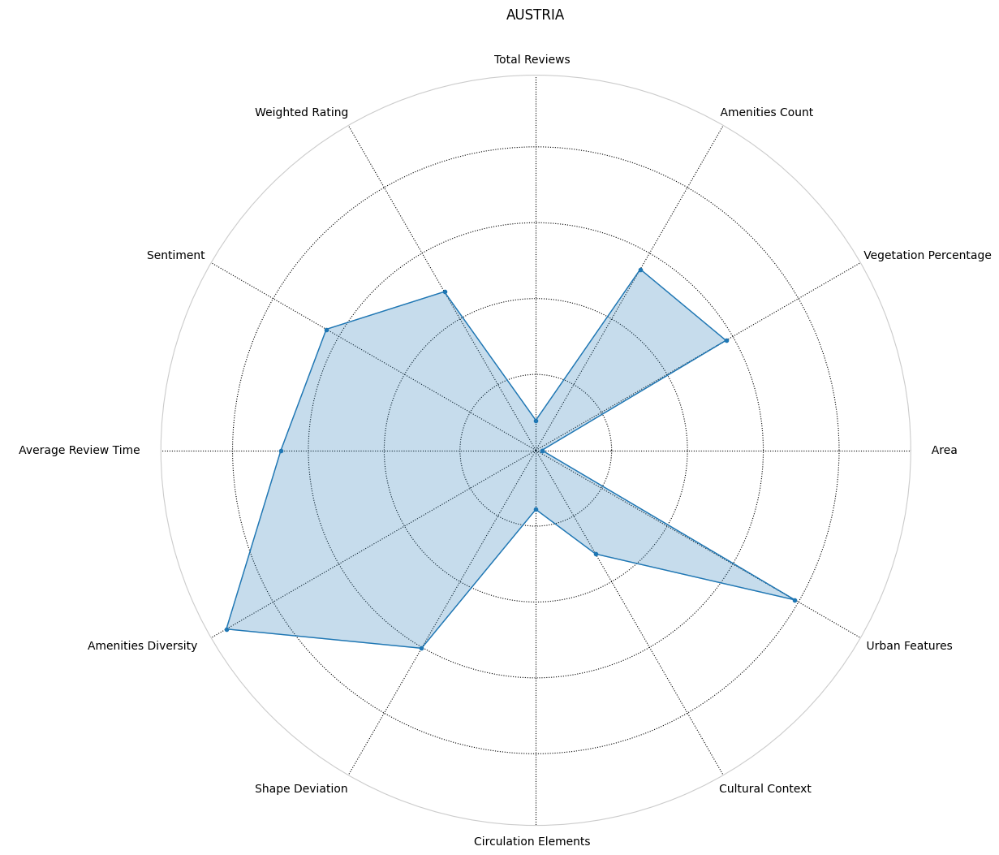

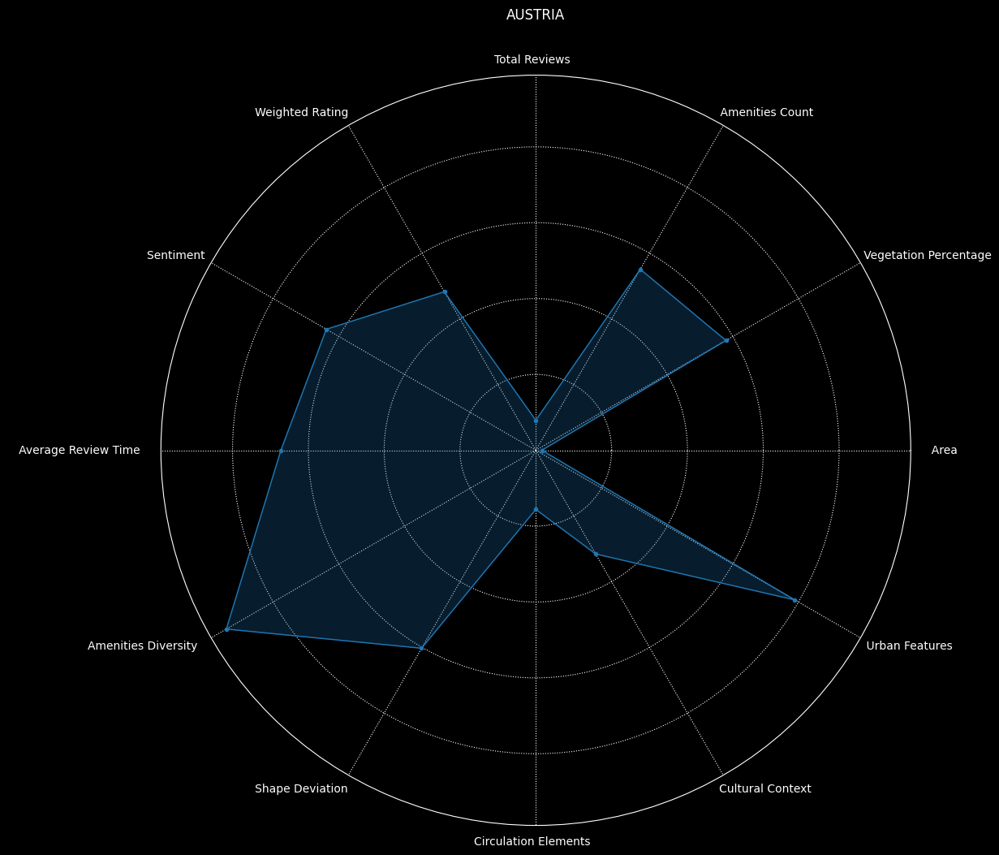

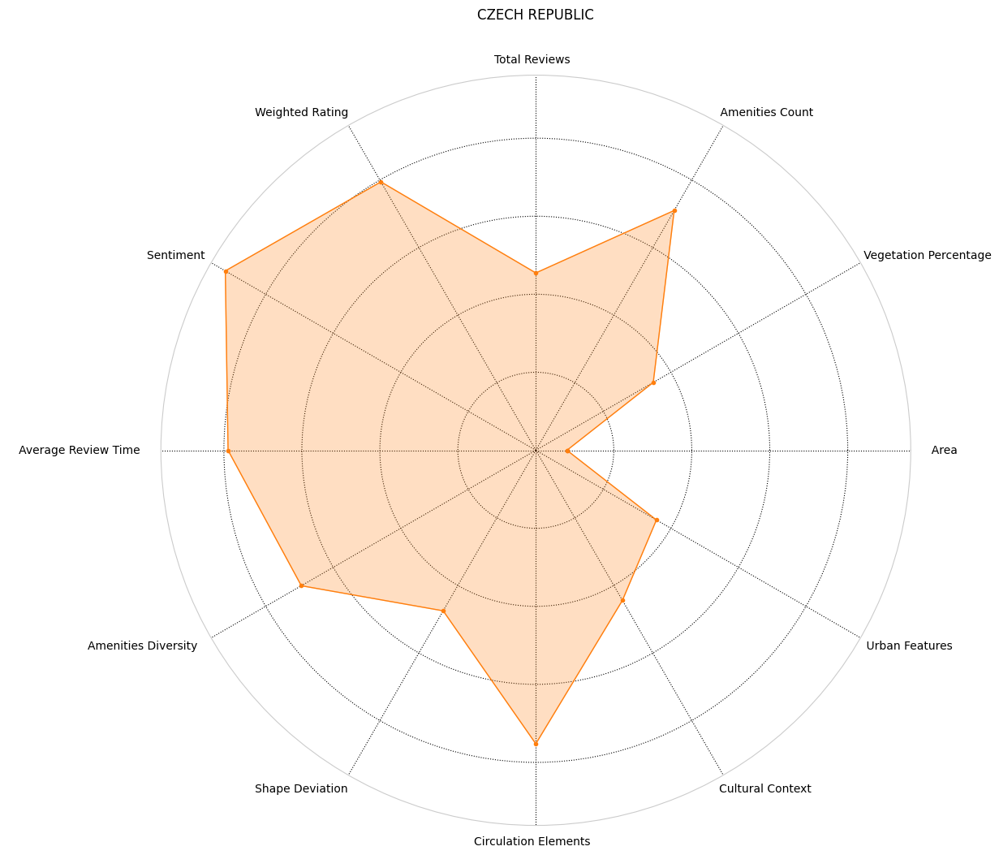

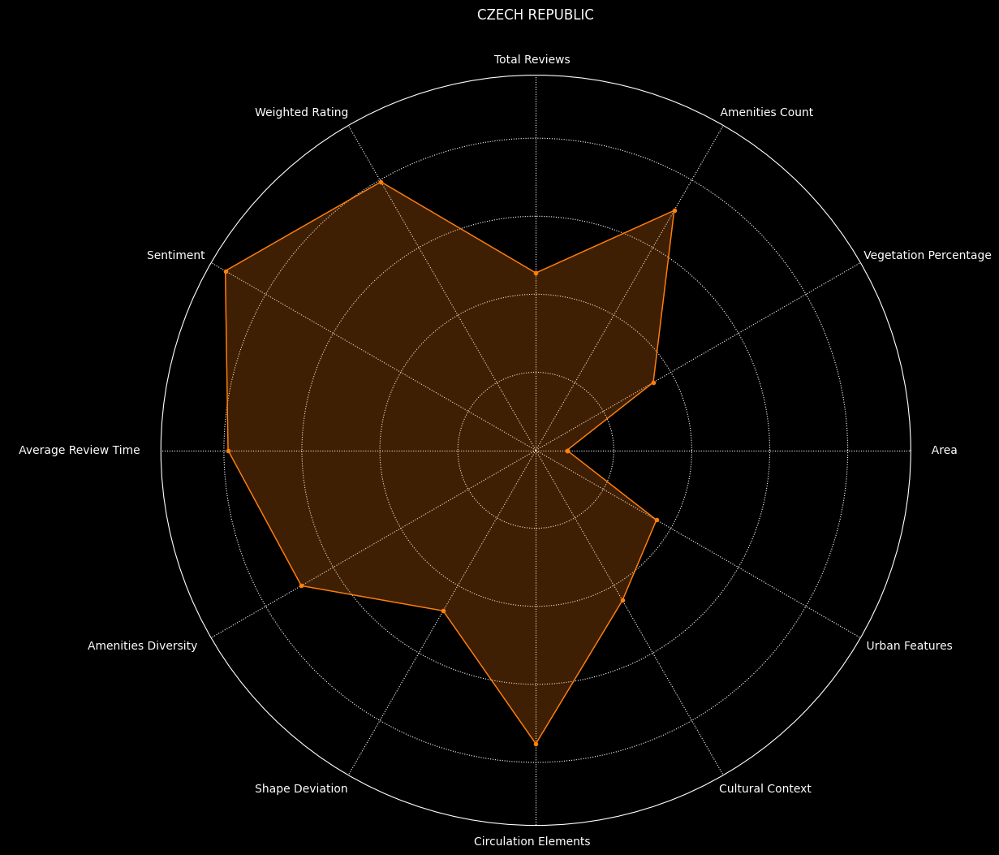

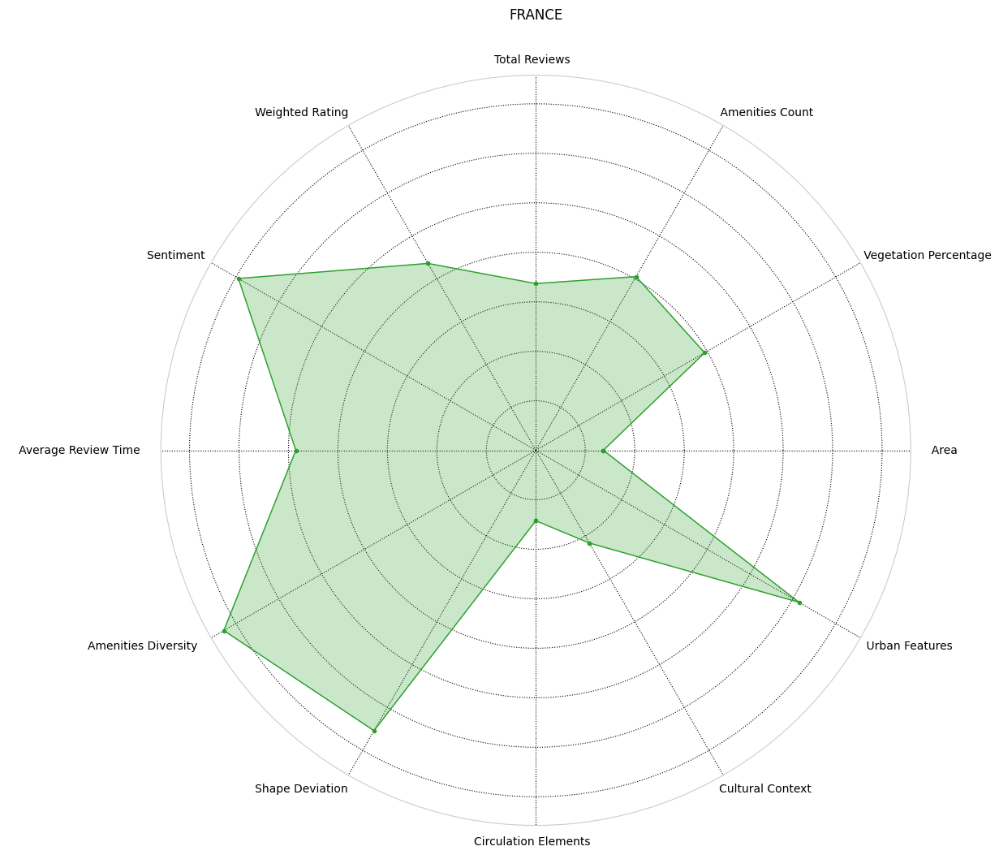

...

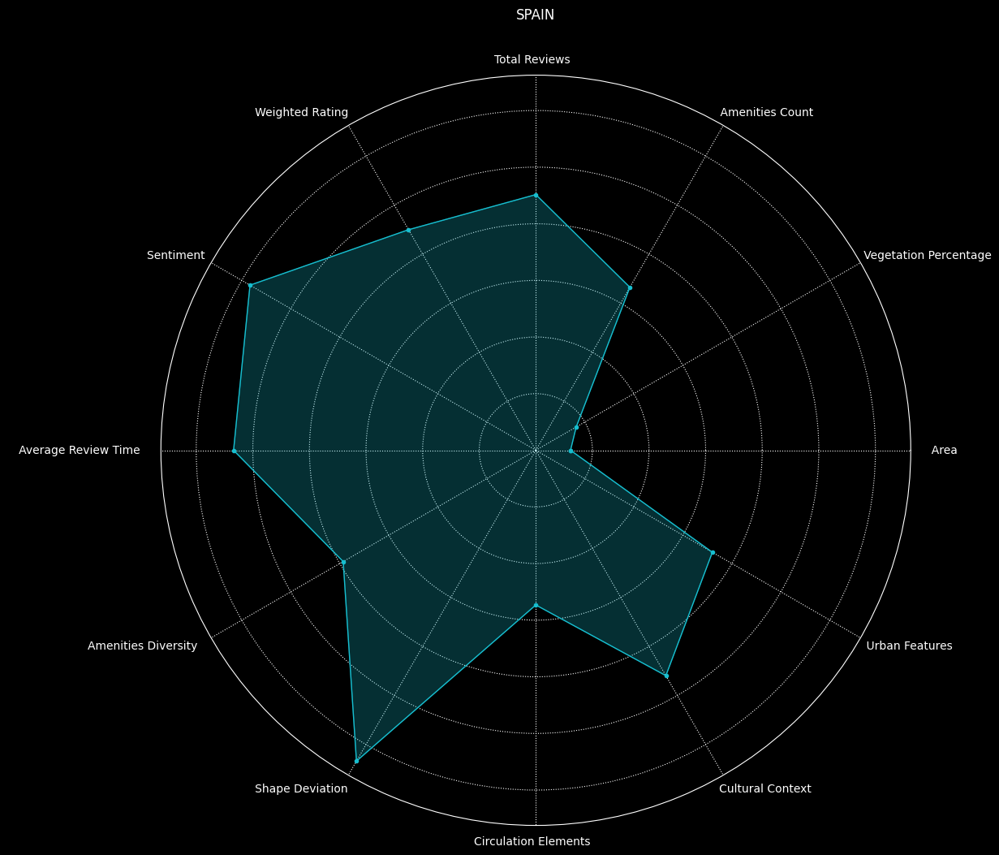

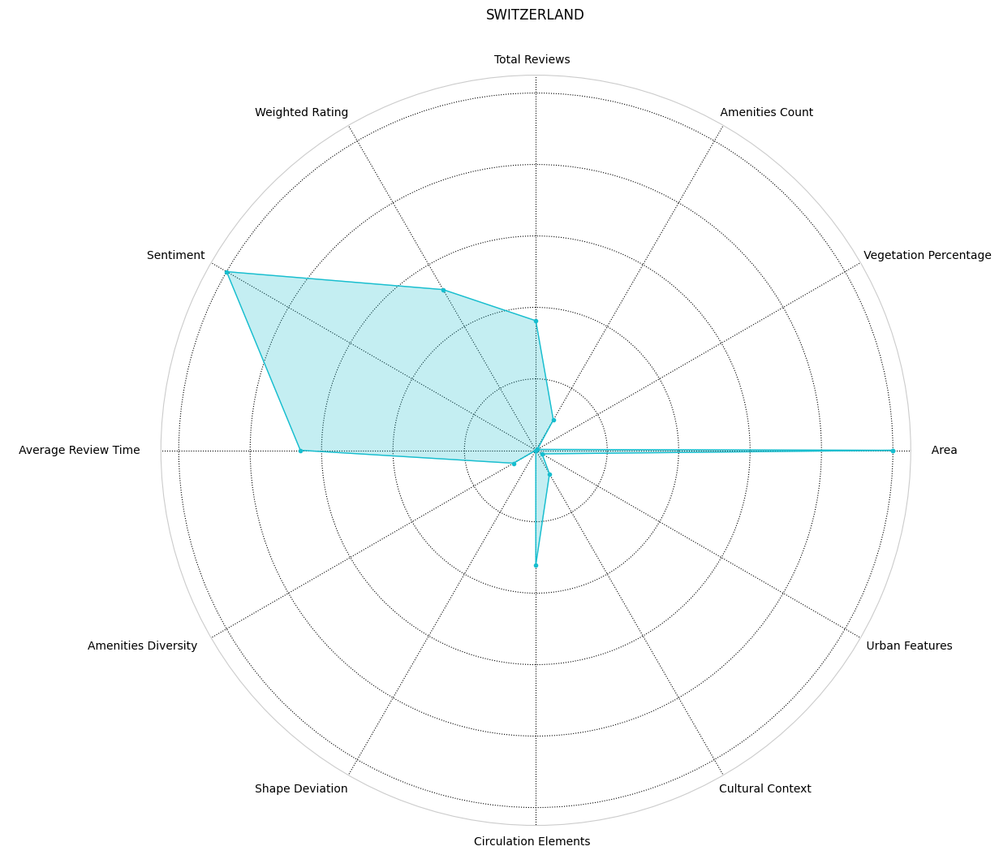

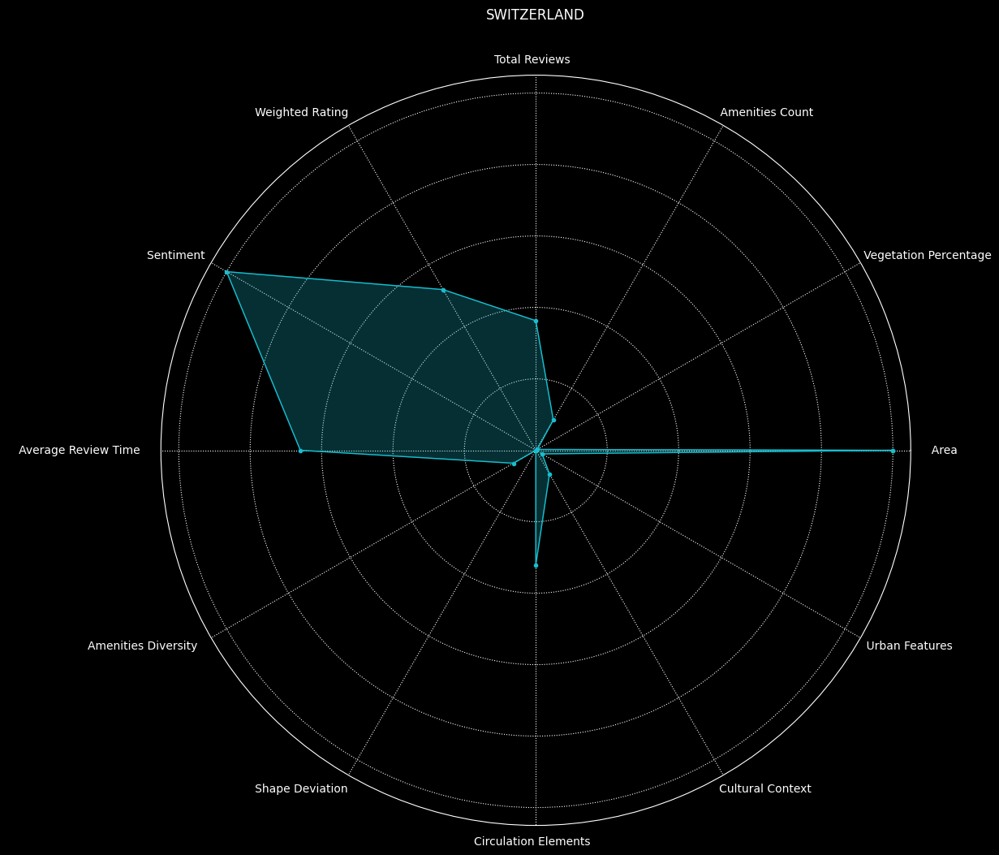

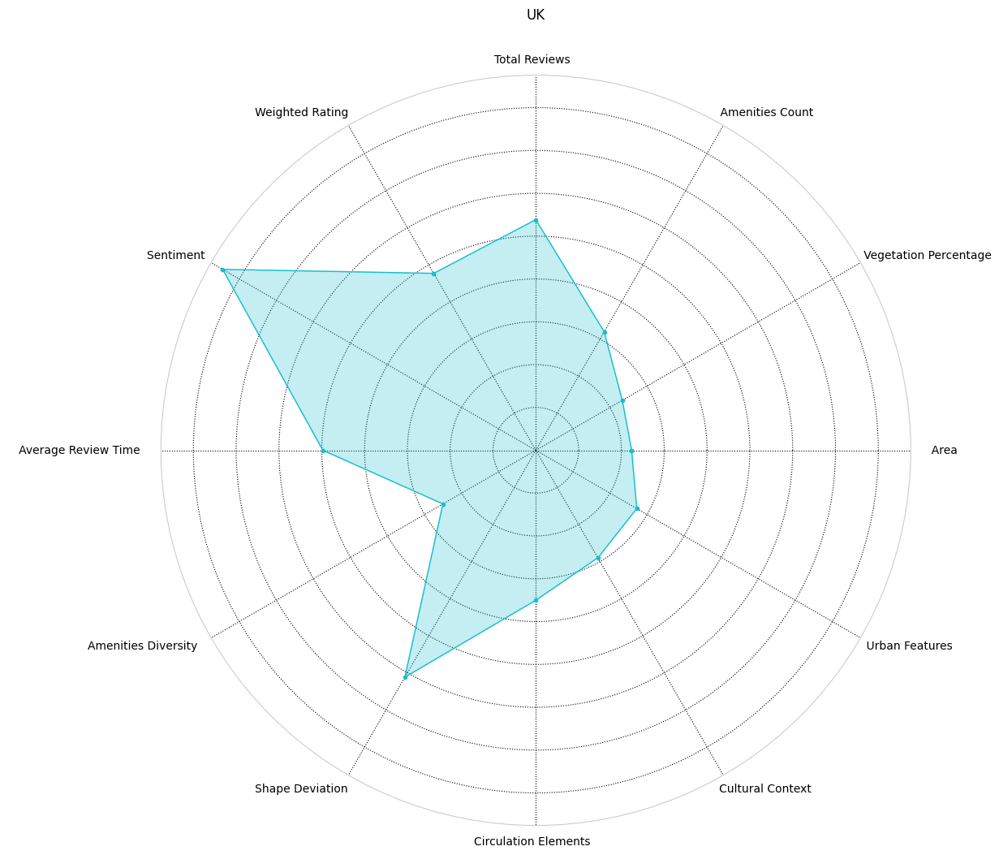

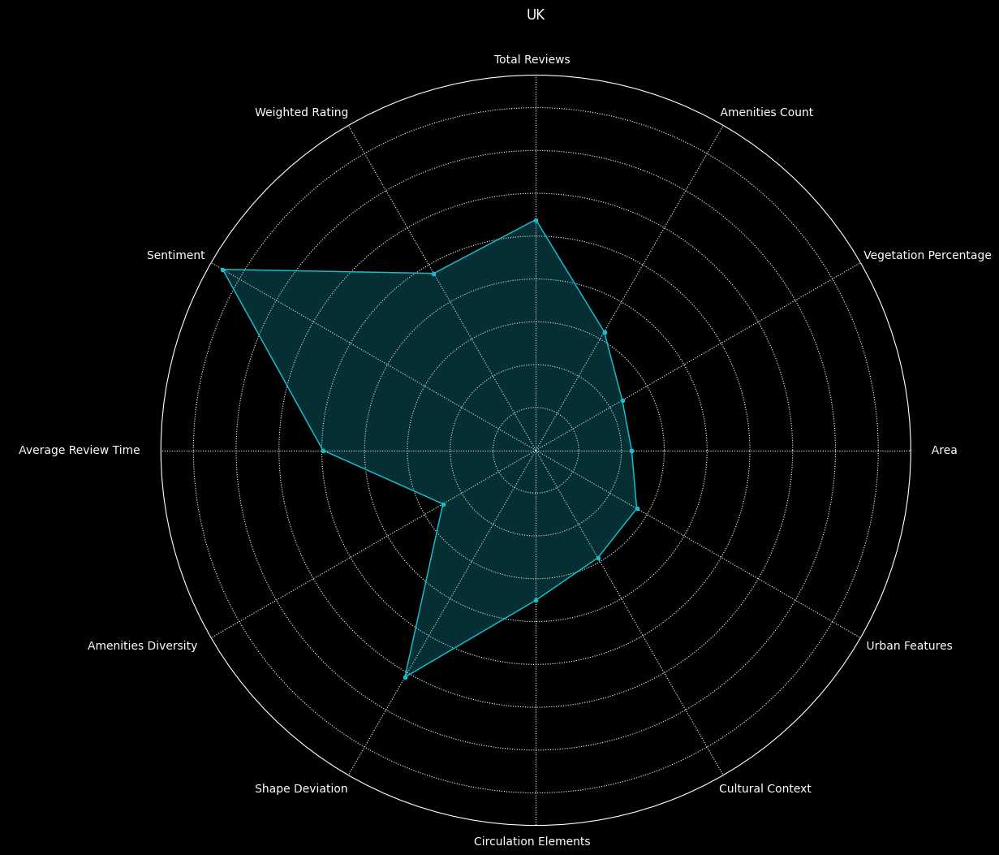

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

city_country_mapping = {
    'Firenze': 'Italy',
    'Rotterdam': 'Netherlands',
    'Utrecht': 'Netherlands',
    'Lille': 'France',
    'Venezia': 'Italy',
    'Napoli': 'Italy',
    'Toulouse': 'France',
    'Bologna': 'Italy',
    'Lisboa': 'Portugal',
    'Porto': 'Portugal',
    'Wien': 'Austria',
    'Lyon': 'France',
    'Stuttgart': 'Germany',
    'Geneva': 'Switzerland',
    'Koln': 'Germany',
    'Frankfurt am Main': 'Germany',
    'Marseille': 'France',
    'Dublin': 'Ireland',
    'Strasbourg': 'France',
    'Bordeaux': 'France',
    'Nantes': 'France',
    'Warszawa': 'Poland',
    'Praha': 'Czech Republic',
    'Krakow': 'Poland',
    'Granada': 'Spain',
    'A Coruna': 'Spain',
    'Sevilla': 'Spain',
    'Barcelona': 'Spain',
    'Hamburg': 'Germany',
    'Amsterdam': 'Netherlands',
    'Luxembourg': 'Luxembourg',
    'Liverpool': 'UK',
    'Manchester': 'UK',
    'Munich': 'Germany',
    'Berlin': 'Germany',
    'Paris': 'France',
    'Bristol': 'UK',
    'Birmingham': 'UK',
    'Madrid': 'Spain',
    'London': 'UK',
    'Milano': 'Italy',
    'Roma': 'Italy'
}

# Map cities to their countries
city_means_scaled['country'] = city_means_scaled['city'].map(city_country_mapping)

# Calculate country averages
country_means = city_means_scaled.groupby('country').mean()

new_labels = ['          Area', '                              Vegetation Percentage', '                    Amenities Count', 'Total Reviews  ',
              '   Weighted Rating                         ', 'Sentiment            ', '   Average Review Time                                        ', 'Amenities Diversity                               ',
              '   Shape Deviation                         ', 'Circulation Elements  ', '                   Cultural Context', '                    Urban Features']

colors = plt.get_cmap('tab10')

for i, row in country_means.iterrows():
    country = i
    values = row.tolist()

    num_vars = len(values)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    values += values[:1]
    angles += angles[:1]

    color = colors(np.where(country_means.index == i)[0][0])  # use unique color for each country

    # White background, unique color lines
    fig1, ax1 = plt.subplots(figsize=(12, 12), subplot_kw=dict(polar=True))
    ax1.fill(angles, values, color=color, alpha=0.25)
    ax1.plot(angles, values, color=color, linewidth=1, linestyle='solid', marker='o', markersize=3)
    ax1.set_title(country.upper(), color='black', pad=50, loc='center', fontsize=12)
    ax1.set_xticks(angles[:-1])
    ax1.set_xticklabels(new_labels, color='black', horizontalalignment='center')
    ax1.set_yticklabels([])
    ax1.grid(linestyle='dotted', color='black')
    ax1.set_rlabel_position(0)
    plt.show()

    # Black background, unique color lines
    fig2, ax2 = plt.subplots(figsize=(12, 12), subplot_kw=dict(polar=True))
    ax2.fill(angles, values, color=color, alpha=0.25)
    ax2.plot(angles, values, color=color, linewidth=1, linestyle='solid', marker='o', markersize=3)
    ax2.set_title(country.upper(), color='white', pad=50, loc='center', fontsize=12)
    ax2.patch.set_facecolor('black')
    fig2.patch.set_facecolor('black')
    ax2.set_xticks(angles[:-1])
    ax2.set_xticklabels(new_labels, color='white', horizontalalignment='center')
    ax2.set_yticklabels([])
    ax2.grid(linestyle='dotted', color='white')
    ax2.spines['polar'].set_color('white')
    ax2.set_rlabel_position(0)
    plt.show()


In [ ]:
city_country_mapping = {
    'Firenze': 'Italy',
    'Rotterdam': 'Netherlands',
    'Utrecht': 'Netherlands',
    'Lille': 'France',
    'Venezia': 'Italy',
    'Napoli': 'Italy',
    'Toulouse': 'France',
    'Bologna': 'Italy',
    'Lisboa': 'Portugal',
    'Porto': 'Portugal',
    'Wien': 'Austria',
    'Lyon': 'France',
    'Stuttgart': 'Germany',
    'Geneva': 'Switzerland',
    'Koln': 'Germany',
    'Frankfurt am Main': 'Germany',
    'Marseille': 'France',
    'Dublin': 'Ireland',
    'Strasbourg': 'France',
    'Bordeaux': 'France',
    'Nantes': 'France',
    'Warszawa': 'Poland',
    'Praha': 'Czech Republic',
    'Krakow': 'Poland',
    'Granada': 'Spain',
    'A Coruna': 'Spain',
    'Sevilla': 'Spain',
    'Barcelona': 'Spain',
    'Hamburg': 'Germany',
    'Amsterdam': 'Netherlands',
    'Luxembourg': 'Luxembourg',
    'Liverpool': 'UK',
    'Manchester': 'UK',
    'Munich': 'Germany',
    'Berlin': 'Germany',
    'Paris': 'France',
    'Bristol': 'UK',
    'Birmingham': 'UK',
    'Madrid': 'Spain',
    'London': 'UK',
    'Milano': 'Italy',
    'Roma': 'Italy'
}

# Mapping city to country and creating a new column 'country'
new_df['country'] = new_df['city'].map(city_country_mapping)


In [ ]:
new_df.columns

Index(['city', 'area', 'Vegetation_Cover', 'Amenities_Total_Count',
       'park_name', 'reviews_count', 'weighted_rating', 'sentiment_score',
       'Sentiment', 'avg_review_time', 'time_of_day',
       'Amenities_Diversity_Shannon', 'Amenities_Diversity', 'Shape_Deviation',
       'Urban_Circulation_Amenities', 'Cultural_Context', 'Urban_Features',
       'country'],
      dtype='object')

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from pandas.plotting import parallel_coordinates

# list of numerical columns, including 'area'
num_cols = ['area', 'Vegetation_Cover', 'Amenities_Total_Count', 'reviews_count',
            'weighted_rating', 'sentiment_score', 'avg_review_time', 'Amenities_Diversity_Shannon',
            'Amenities_Diversity', 'Shape_Deviation', 'Urban_Circulation_Amenities',
            'Cultural_Context', 'Urban_Features']

# Save 'country' column
countries = new_df['country'].copy()

# filter dataframe to keep only numerical columns
new_df_numerical = new_df[num_cols].copy()

# Initialize a scaler, then apply it to the features
scaler = MinMaxScaler(feature_range=(0, 10))
new_df_numerical = pd.DataFrame(scaler.fit_transform(new_df_numerical), columns=num_cols)

# Append 'country' column back to the numerical dataframe
new_df_numerical['country'] = countries

# New labels
new_labels = ['Area', 'Vegetation Percentage', 'Amenities Count', 'Total Reviews',
              'Weighted Rating', 'Sentiment Score', 'Average Review Time', 'Amenities Diversity',
              'Shannon Diversity', 'Shape Deviation', 'Circulation Elements',
              'Cultural Context', 'Urban Features']

# Renaming the dataframe columns for the plot
rename_dict = {old: new for old, new in zip(num_cols, new_labels)}
new_df_numerical.rename(columns=rename_dict, inplace=True)

# Create the parallel coordinates plot
plt.figure(figsize=(15,10))

# Define the color map
cmap = plt.get_cmap('tab20_r')
colors = cmap(np.linspace(0, 1, len(new_df_numerical['country'].unique())))

pc = parallel_coordinates(new_df_numerical, class_column='country', cols=new_labels, color=colors, linewidth=0.1)

# Change legend line to circle markers
legend = plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
for handle in legend.legendHandles:
    handle.set_linestyle("")
    handle.set_marker('o')

# Rotate x-axis labels
plt.xticks(rotation='vertical')

plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from pandas.plotting import parallel_coordinates

# list of numerical columns, including 'area'
num_cols = ['area', 'Vegetation_Cover', 'Amenities_Total_Count', 'reviews_count',
            'weighted_rating', 'sentiment_score', 'avg_review_time', 'Amenities_Diversity_Shannon',
            'Amenities_Diversity', 'Shape_Deviation', 'Urban_Circulation_Amenities',
            'Cultural_Context', 'Urban_Features']

# Save 'city' column
cities = new_df['city'].copy()

# filter dataframe to keep only numerical columns
new_df_numerical = new_df[num_cols].copy()

# Initialize a scaler, then apply it to the features
scaler = MinMaxScaler(feature_range=(0, 10))
new_df_numerical = pd.DataFrame(scaler.fit_transform(new_df_numerical), columns=num_cols)

# Append 'city' column back to the numerical dataframe
new_df_numerical['city'] = cities

# New labels
new_labels = ['Area', 'Vegetation Percentage', 'Amenities Count', 'Total Reviews',
              'Weighted Rating', 'Sentiment Score', 'Average Review Time', 'Amenities Diversity',
              'Shannon Diversity', 'Shape Deviation', 'Circulation Elements',
              'Cultural Context', 'Urban Features']

# Renaming the dataframe columns for the plot
rename_dict = {old: new for old, new in zip(num_cols, new_labels)}
new_df_numerical.rename(columns=rename_dict, inplace=True)

# Create the parallel coordinates plot
plt.figure(figsize=(15,10))

# Define the color map
cmap = plt.get_cmap('gist_ncar')
colors = cmap(np.linspace(0, 1, len(new_df_numerical['city'].unique())))

pc = parallel_coordinates(new_df_numerical, class_column='city', cols=new_labels, color=colors, linewidth=0.1)

# Change legend line to circle markers
legend = plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
for handle in legend.legendHandles:
    handle.set_linestyle("")
    handle.set_marker('o')

# Rotate x-axis labels
plt.xticks(rotation='vertical')

plt.show()


In [ ]:
print(new_df.columns)


Index(['city', 'area', 'Area', 'Vegetation Percentage', 'park_name',
       'Amenities Count', 'Total Reviews', 'Weighted Rating', 'Sentiment',
       'Sentiment', 'time_of_day', 'Average Review Time',
       'Amenities Diversity', 'Shannon Diversity', 'Shape Deviation',
       'Circulation Elements', 'Cultural Context', 'country'],
      dtype='object')


# Sentiment Subsets